# Zillow Houses: Full ML pipeline

This notebook contains full machine learning pipeline of Zillow Houses competition.


Pipeline is consists of 10 general steps

1) Exploratory Data Analysis (Univariate, Bivariate, Hypothesis testing, Confident Interals)

2) Missing values (different advanced and not strategies to impute: MICE algo with the using of gradient boosting, lightgbm etc.)

3) Duplicate checking

4) Advanced Anomaly Detection (models such as KNN, Isolation Forests, and final detector witch aggregates results from base models - SUOD)

5) Multicollinearity problem solving

6) Feature Engineering

7) Feature Transformation of some features with hypothesis testing on it (fitting distributions with some statistical tests)

8) Advanced Feature Selection and not - Recursive Feature Elimination with cross-validation on different tree-based models such as Gradient Boosting, Random Forests etc) and of course Lasso with L1-norm, Feature Importances of trees and combine them into one algorithm witch takes in account all the above method

9) Modeling (different regression models, fine-tuning, learning curves, validation curves, Residuals Analysis etc.). Later, i wan't to use some stacking stategies on boosted trees and some NN models

10) Results analysis: best model selection with the using of confident intervals and different non-parametric statistical tests etc.


This solution also contains custom preprocessing pipeline witch automaticly can do 2-8 steps

Preprocessing pipeline you can find in my repository on GitHub here: https://github.com/Pashase/Zillow-Houses

In [ ]:
detector_path = None

In [ ]:
# !pip install lightgbm==3.3.1
!pip install scipy==1.7.1
!pip install miceforest
!pip install fitter
!pip install pyod
!pip install suod
# !pip install sklearn
!pip install xgboost
!pip install plotly
!pip install joblib
!pip install yellowbrick

     |████████████████████████████████| 28.5 MB 73.4 MB/s 
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 2.0 MB 51.8 MB/s 
  Attempting uninstall: lightgbm
    Found existing installation: lightgbm 2.2.3
    Uninstalling lightgbm-2.2.3:
      Successfully uninstalled lightgbm-2.2.3
     |████████████████████████████████| 47 kB 4.4 MB/s 
  Created wheel for fitter: filename=fitter-1.4.0-py3-none-any.whl size=25025 sha256=1a882db934f8180a8bbf134dcaee0891f1513ad5f871b81bfa05ce9a1f6c7cdb
  Stored in directory: /root/.cache/pip/wheels/e1/98/16/e5263962f94fbfaad79902aa94652516cacc

# Base imports

In [ ]:
import time
import os
import re
import typing as tp

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as sts

# from fitter import Fitter, get_common_distributions, get_distributions

import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# from plotly.offline import plot, iplot, init_notebook_mode
# init_notebook_mode(connected=True)

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
sns.set(rc={'figure.figsize': (12, 7)})

from google.colab import drive
drive.mount('/content/drive')

DATA_PATH = '/content/drive/MyDrive/Kaggle_competitions/Zillow'

Mounted at /content/drive


# Read data

In [ ]:
prop_2016 = pd.read_csv(f'{DATA_PATH}/properties_2016.csv')
train_2016_v2 = pd.read_csv(f'{DATA_PATH}/train_2016_v2.csv',
                            parse_dates=['transactiondate'])

sub_example = pd.read_csv(f'{DATA_PATH}/sample_submission.csv')

In [ ]:
df_train = train_2016_v2.merge(prop_2016, how='left', on='parcelid')

sub_example.rename(columns={'ParcelId': 'parcelid'}, inplace=True)
df_test = sub_example.merge(prop_2016, how='left', on='parcelid')

In [ ]:
df_train.head()

,parcelid,logerror,transactiondate,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,finishedfloor1squarefeet,calculatedfinishedsquarefeet,finishedsquarefeet12,finishedsquarefeet13,finishedsquarefeet15,finishedsquarefeet50,finishedsquarefeet6,fips,fireplacecnt,fullbathcnt,garagecarcnt,garagetotalsqft,hashottuborspa,heatingorsystemtypeid,latitude,longitude,lotsizesquarefeet,poolcnt,poolsizesum,pooltypeid10,pooltypeid2,pooltypeid7,propertycountylandusecode,propertylandusetypeid,propertyzoningdesc,rawcensustractandblock,regionidcity,regionidcounty,regionidneighborhood,regionidzip,roomcnt,storytypeid,threequarterbathnbr,typeconstructiontypeid,unitcnt,yardbuildingsqft17,yardbuildingsqft26,yearbuilt,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,11016594,0.0276,2016-01-01,1.0,NaN,NaN,2.0,3.0,NaN,4.0,2.0,NaN,NaN,1684.0,1684.0,NaN,NaN,NaN,NaN,6037.0,NaN,2.0,NaN,NaN,NaN,2.0,34280990.0,-118488536.0,7528.0,NaN,NaN,NaN,NaN,NaN,0100,261.0,LARS,6.037107e+07,12447.0,3101.0,31817.0,96370.0,0.0,NaN,NaN,NaN,1.0,NaN,NaN,1959.0,NaN,NaN,122754.0,360170.0,2015.0,237416.0,6735.88,NaN,NaN,6.037107e+13
1,14366692,-0.1684,2016-01-01,NaN,NaN,NaN,3.5,4.0,NaN,NaN,3.5,NaN,NaN,2263.0,2263.0,NaN,NaN,NaN,NaN,6059.0,NaN,3.0,2.0,468.0,NaN,NaN,33668120.0,-117677556.0,3643.0,NaN,NaN,NaN,NaN,NaN,1,261.0,NaN,6.059052e+07,32380.0,1286.0,NaN,96962.0,0.0,NaN,1.0,NaN,NaN,NaN,NaN,2014.0,NaN,NaN,346458.0,585529.0,2015.0,239071.0,10153.02,NaN,NaN,NaN
2,12098116,-0.0040,2016-01-01,1.0,NaN,NaN,3.0,2.0,NaN,4.0,3.0,NaN,NaN,2217.0,2217.0,NaN,NaN,NaN,NaN,6037.0,NaN,3.0,NaN,NaN,NaN,2.0,34136312.0,-118175032.0,11423.0,NaN,NaN,NaN,NaN,NaN,0100,261.0,PSR6,6.037464e+07,47019.0,3101.0,275411.0,96293.0,0.0,NaN,NaN,NaN,1.0,NaN,NaN,1940.0,NaN,NaN,61994.0,119906.0,2015.0,57912.0,11484.48,NaN,NaN,6.037464e+13
3,12643413,0.0218,2016-01-02,1.0,NaN,NaN,2.0,2.0,NaN,4.0,2.0,NaN,NaN,839.0,839.0,NaN,NaN,NaN,NaN,6037.0,NaN,2.0,NaN,NaN,NaN,2.0,33755800.0,-118309000.0,70859.0,NaN,NaN,NaN,NaN,NaN,010C,266.0,LAR3,6.037296e+07,12447.0,3101.0,54300.0,96222.0,0.0,NaN,NaN,NaN,1.0,NaN,NaN,1987.0,NaN,NaN,171518.0,244880.0,2015.0,73362.0,3048.74,NaN,NaN,6.037296e+13
4,14432541,-0.0050,2016-01-02,NaN,NaN,NaN,2.5,4.0,NaN,NaN,2.5,NaN,NaN,2283.0,2283.0,NaN,NaN,NaN,NaN,6059.0,NaN,2.0,2.0,598.0,NaN,NaN,33485643.0,-117700234.0,6000.0,1.0,NaN,NaN,NaN,1.0,122,261.0,NaN,6.059042e+07,17686.0,1286.0,NaN,96961.0,8.0,NaN,1.0,NaN,NaN,NaN,NaN,1981.0,2.0,NaN,169574.0,434551.0,2015.0,264977.0,5488.96,NaN,NaN,6.059042e+13


In [ ]:
df_test.head()

,parcelid,201610,201611,201612,201710,201711,201712,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,finishedfloor1squarefeet,calculatedfinishedsquarefeet,finishedsquarefeet12,finishedsquarefeet13,finishedsquarefeet15,finishedsquarefeet50,finishedsquarefeet6,fips,fireplacecnt,fullbathcnt,garagecarcnt,garagetotalsqft,hashottuborspa,heatingorsystemtypeid,latitude,longitude,lotsizesquarefeet,poolcnt,poolsizesum,pooltypeid10,pooltypeid2,pooltypeid7,propertycountylandusecode,propertylandusetypeid,propertyzoningdesc,rawcensustractandblock,regionidcity,regionidcounty,regionidneighborhood,regionidzip,roomcnt,storytypeid,threequarterbathnbr,typeconstructiontypeid,unitcnt,yardbuildingsqft17,yardbuildingsqft26,yearbuilt,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,10754147,0,0,0,0,0,0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6037.0,NaN,NaN,NaN,NaN,NaN,NaN,34144442.0,-118654084.0,85768.0,NaN,NaN,NaN,NaN,NaN,010D,269.0,NaN,6.037800e+07,37688.0,3101.0,NaN,96337.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,2015.0,9.0,NaN,NaN,NaN,NaN
1,10759547,0,0,0,0,0,0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6037.0,NaN,NaN,NaN,NaN,NaN,NaN,34140430.0,-118625364.0,4083.0,NaN,NaN,NaN,NaN,NaN,0109,261.0,LCA11*,6.037800e+07,37688.0,3101.0,NaN,96337.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27516.0,2015.0,27516.0,NaN,NaN,NaN,NaN
2,10843547,0,0,0,0,0,0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,73026.0,NaN,NaN,73026.0,NaN,NaN,6037.0,NaN,NaN,NaN,NaN,NaN,NaN,33989359.0,-118394633.0,63085.0,NaN,NaN,NaN,NaN,NaN,1200,47.0,LAC2,6.037703e+07,51617.0,3101.0,NaN,96095.0,0.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,650756.0,1413387.0,2015.0,762631.0,20800.37,NaN,NaN,NaN
3,10859147,0,0,0,0,0,0,NaN,NaN,NaN,0.0,0.0,3.0,7.0,NaN,NaN,NaN,5068.0,NaN,NaN,5068.0,NaN,NaN,6037.0,NaN,NaN,NaN,NaN,NaN,NaN,34148863.0,-118437206.0,7521.0,NaN,NaN,NaN,NaN,NaN,1200,47.0,LAC2,6.037141e+07,12447.0,3101.0,27080.0,96424.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1948.0,1.0,NaN,571346.0,1156834.0,2015.0,585488.0,14557.57,NaN,NaN,NaN
4,10879947,0,0,0,0,0,0,NaN,NaN,NaN,0.0,0.0,4.0,NaN,NaN,NaN,NaN,1776.0,NaN,NaN,1776.0,NaN,NaN,6037.0,NaN,NaN,NaN,NaN,NaN,NaN,34194168.0,-118385816.0,8512.0,NaN,NaN,NaN,NaN,NaN,1210,31.0,LAM1,6.037123e+07,12447.0,3101.0,46795.0,96450.0,0.0,NaN,NaN,NaN,1.0,NaN,NaN,1947.0,NaN,NaN,193796.0,433491.0,2015.0,239695.0,5725.17,NaN,NaN,NaN


Распарсим дату всех транзакций, год не нужен, так как он имеет одну градацию и не имеет практического смысла

In [ ]:
df_train['month'] = df_train['transactiondate'].dt.month
df_train['day'] = df_train['transactiondate'].dt.day

# EDA

Получим представление о том, с какими типами признаков и в каком количестве мы работаем.


In [ ]:
categorical_features = [
    'airconditioningtypeid', 'architecturalstyletypeid', 'buildingqualitytypeid',
    'buildingclasstypeid', 'decktypeid', 'fireplaceflag',
    'hashottuborspa', 'heatingorsystemtypeid', 'pooltypeid10',
    'pooltypeid2', 'pooltypeid7', 'propertycountylandusecode',
    'propertylandusetypeid', 'propertyzoningdesc', 'regionidcountry',
    'regionidcity', 'regionidneighborhood', 'storytypeid',
    'storytypeid', 'typeconstructiontypeid', 'taxdelinquencyflag',
    'day', 'month',
]
numerical_features = list(df_train.columns[~df_train.columns.isin(categorical_features)])

Изменим тип категориальных переменных в связи с тем, что они перемешаны с числовым типом. А остальные скастим до наиболее подходящего типа

In [ ]:
for feature_name in df_train.columns:
    if feature_name in categorical_features:
        df_train[feature_name] = df_train[feature_name].astype('category')
        
df_train.convert_dtypes()

,parcelid,logerror,transactiondate,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,finishedfloor1squarefeet,calculatedfinishedsquarefeet,finishedsquarefeet12,finishedsquarefeet13,finishedsquarefeet15,finishedsquarefeet50,finishedsquarefeet6,fips,fireplacecnt,fullbathcnt,garagecarcnt,garagetotalsqft,hashottuborspa,heatingorsystemtypeid,latitude,longitude,lotsizesquarefeet,poolcnt,poolsizesum,pooltypeid10,pooltypeid2,pooltypeid7,propertycountylandusecode,propertylandusetypeid,propertyzoningdesc,rawcensustractandblock,regionidcity,regionidcounty,regionidneighborhood,regionidzip,roomcnt,storytypeid,threequarterbathnbr,typeconstructiontypeid,unitcnt,yardbuildingsqft17,yardbuildingsqft26,yearbuilt,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock,month,day
0,11016594,0.0276,2016-01-01,1.0,NaN,<NA>,2.0,3,NaN,4.0,2.0,NaN,<NA>,1684,1684,<NA>,<NA>,<NA>,<NA>,6037,<NA>,2,<NA>,<NA>,NaN,2.0,34280990,-118488536,7528.0,<NA>,<NA>,NaN,NaN,NaN,0100,261.0,LARS,6.037107e+07,12447.0,3101,31817.0,96370,0,NaN,<NA>,NaN,1,<NA>,<NA>,1959,<NA>,NaN,122754,360170,2015,237416,6735.88,NaN,<NA>,60371066461001,1,1
1,14366692,-0.1684,2016-01-01,NaN,NaN,<NA>,3.5,4,NaN,NaN,3.5,NaN,<NA>,2263,2263,<NA>,<NA>,<NA>,<NA>,6059,<NA>,3,2,468,NaN,NaN,33668120,-117677556,3643.0,<NA>,<NA>,NaN,NaN,NaN,1,261.0,NaN,6.059052e+07,32380.0,1286,NaN,96962,0,NaN,1,NaN,<NA>,<NA>,<NA>,2014,<NA>,NaN,346458,585529,2015,239071,10153.02,NaN,<NA>,<NA>,1,1
2,12098116,-0.0040,2016-01-01,1.0,NaN,<NA>,3.0,2,NaN,4.0,3.0,NaN,<NA>,2217,2217,<NA>,<NA>,<NA>,<NA>,6037,<NA>,3,<NA>,<NA>,NaN,2.0,34136312,-118175032,11423.0,<NA>,<NA>,NaN,NaN,NaN,0100,261.0,PSR6,6.037464e+07,47019.0,3101,275411.0,96293,0,NaN,<NA>,NaN,1,<NA>,<NA>,1940,<NA>,NaN,61994,119906,2015,57912,11484.48,NaN,<NA>,60374638003004,1,1
3,12643413,0.0218,2016-01-02,1.0,NaN,<NA>,2.0,2,NaN,4.0,2.0,NaN,<NA>,839,839,<NA>,<NA>,<NA>,<NA>,6037,<NA>,2,<NA>,<NA>,NaN,2.0,33755800,-118309000,70859.0,<NA>,<NA>,NaN,NaN,NaN,010C,266.0,LAR3,6.037296e+07,12447.0,3101,54300.0,96222,0,NaN,<NA>,NaN,1,<NA>,<NA>,1987,<NA>,NaN,171518,244880,2015,73362,3048.74,NaN,<NA>,60372963002002,1,2
4,14432541,-0.0050,2016-01-02,NaN,NaN,<NA>,2.5,4,NaN,NaN,2.5,NaN,<NA>,2283,2283,<NA>,<NA>,<NA>,<NA>,6059,<NA>,2,2,598,NaN,NaN,33485643,-117700234,6000.0,1,<NA>,NaN,NaN,1.0,122,261.0,NaN,6.059042e+07,17686.0,1286,NaN,96961,8,NaN,1,NaN,<NA>,<NA>,<NA>,1981,2,NaN,169574,434551,2015,264977,5488.96,NaN,<NA>,60590423381006,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90270,10774160,-0.0356,2016-12-30,1.0,NaN,<NA>,1.0,1,NaN,4.0,1.0,NaN,<NA>,653,653,<NA>,<NA>,<NA>,<NA>,6037,<NA>,1,<NA>,<NA>,NaN,2.0,34203000,-118562000,93676.0,1,<NA>,NaN,NaN,1.0,010C,266.0,LARD1.5,6.037132e+07,12447.0,3101,40548.0,96364,0,NaN,<NA>,NaN,1,<NA>,<NA>,1979,<NA>,NaN,43800,191000,2015,147200,2495.24,NaN,<NA>,60371317011005,12,30
90271,12046695,0.0070,2016-12-30,NaN,NaN,<NA>,3.0,3,NaN,4.0,3.0,NaN,<NA>,2856,2856,<NA>,<NA>,<NA>,<NA>,6037,<NA>,3,<NA>,<NA>,NaN,2.0,34198744,-118224849,9343.0,<NA>,<NA>,NaN,NaN,NaN,0100,261.0,GLR1RY,6.037301e+07,45457.0,3101,274580.0,96327,0,NaN,<NA>,NaN,1,<NA>,<NA>,1965,<NA>,NaN,117893,161111,2015,43218,1886.54,NaN,<NA>,60373008002017,12,30
90272,12995401,-0.2679,2016-12-30,NaN,NaN,<NA>,2.0,4,NaN,7.0,2.0,NaN,<NA>,2617,<NA>,<NA>,2617,<NA>,<NA>,6037,<NA>,2,<NA>,<NA>,NaN,NaN,34075655,-118025537,6865.0,<NA>,<NA>,NaN,NaN,NaN,0200,246.0,EMR3YY,6.037433e+07,51861.0,3101,NaN,96478,0,NaN,<NA>,NaN,2,<NA>,<NA>,1924,<NA>,NaN,22008,38096,2015,16088,1925.70,Y,14,60374327001008,12,30
90273,11402105,0.0602,2016-12-30,NaN,NaN,<NA>,2.0,2,NaN,4.0,2.0,NaN,<NA>,1034,1

In [ ]:
df_train.dtypes

parcelid                             int64
logerror                           float64
transactiondate             datetime64[ns]
airconditioningtypeid             category
architecturalstyletypeid          category
                                 ...      
taxdelinquencyflag                category
taxdelinquencyyear                 float64
censustractandblock                float64
month                             category
day                               category
Length: 62, dtype: object

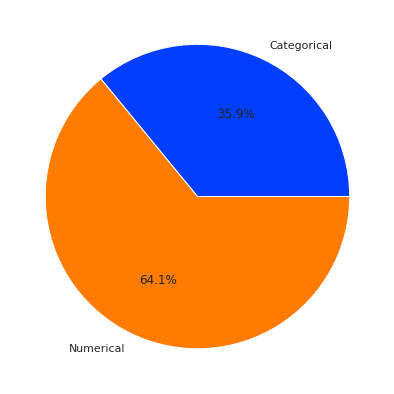

In [ ]:
# plot pie
labels = ['Categorical', 'Numerical']
colors = sns.color_palette('bright')[:len(labels)]
feature_types_dist = [len(categorical_features), len(numerical_features)]
plt.pie(feature_types_dist, labels = labels, colors = colors, autopct='%.1f%%')
plt.show()

Итого: 35.9% категориальных (**23**) и 64.1% числовых признаков (**42**)

## Summary statistics

In [ ]:
df_train.describe()

,parcelid,logerror,basementsqft,bathroomcnt,bedroomcnt,calculatedbathnbr,finishedfloor1squarefeet,calculatedfinishedsquarefeet,finishedsquarefeet12,finishedsquarefeet13,finishedsquarefeet15,finishedsquarefeet50,finishedsquarefeet6,fips,fireplacecnt,fullbathcnt,garagecarcnt,garagetotalsqft,latitude,longitude,lotsizesquarefeet,poolcnt,poolsizesum,rawcensustractandblock,regionidcounty,regionidzip,roomcnt,threequarterbathnbr,unitcnt,yardbuildingsqft17,yardbuildingsqft26,yearbuilt,numberofstories,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyyear,censustractandblock
count,9.027500e+04,90275.000000,43.000000,90275.000000,90275.000000,89093.000000,6856.000000,89614.000000,85596.000000,33.000000,3564.000000,6856.000000,421.000000,90275.000000,9607.000000,89093.000000,29937.000000,29937.000000,9.027500e+04,9.027500e+04,8.012500e+04,17901.0,969.000000,9.027500e+04,90275.000000,90240.000000,90275.000000,12009.000000,58353.000000,2646.000000,95.000000,89519.000000,20570.000000,8.989500e+04,9.027400e+04,90275.0,9.027400e+04,90269.000000,1783.000000,8.967000e+04
mean,1.298466e+07,0.011457,713.581395,2.279474,3.031869,2.309216,1347.974037,1773.185987,1745.454531,1404.545455,2380.090067,1355.546674,2302.546318,6048.870551,1.187884,2.241231,1.812005,345.521228,3.400541e+07,-1.181989e+08,2.911016e+04,1.0,519.827657,6.049179e+07,2525.420770,96586.131184,1.478516,1.008743,1.110414,310.142101,311.694737,1968.532870,1.440739,1.800934e+05,4.576726e+05,2015.0,2.783353e+05,5983.975927,13.402692,6.049151e+13
std,2.504510e+06,0.161079,437.434198,1.004271,1.156436,0.976172,652.399026,928.162393,909.941166,110.108211,1068.207182,673.703488,1346.255242,20.663461,0.484173,0.963142,0.608761,267.015918,2.649654e+05,3.606032e+05,1.217213e+05,0.0,155.054210,2.050549e+05,805.694842,3661.339094,2.819627,0.100830,0.797235,216.721869,346.354850,23.763475,0.544498,2.091299e+05,5.548844e+05,0.0,4.004955e+05,6838.876956,2.715966,2.046605e+11
min,1.071174e+07,-4.605000,100.000000,0.000000,0.000000,1.000000,44.000000,2.000000,2.000000,1056.000000,560.000000,44.000000,257.000000,6037.000000,1.000000,1.000000,0.000000,0.000000,3.333930e+07,-1.194479e+08,1.670000e+02,1.0,28.000000,6.037101e+07,1286.000000,95982.000000,0.000000,1.000000,1.000000,25.000000,18.000000,1885.000000,1.000000,1.000000e+02,2.200000e+01,2015.0,2.200000e+01,49.080000,6.000000,6.037101e+13
25%,1.155950e+07,-0.025300,407.500000,2.000000,2.000000,2.000000,938.000000,1184.000000,1172.000000,1392.000000,1648.000000,938.000000,1112.000000,6037.000000,1.000000,2.000000,2.000000,0.000000,3.381154e+07,-1.184117e+08,5.703000e+03,1.0,420.000000,6.037320e+07,1286.000000,96193.000000,0.000000,1.000000,1.000000,180.000000,100.000000,1953.000000,1.000000,8.124500e+04,1.990232e+05,2015.0,8.222800e+04,2872.830000,13.000000,6.037320e+13
50%,1.254734e+07,0.006000,616.000000,2.000000,3.000000,2.000000,1244.000000,1540.000000,1518.000000,1440.000000,2104.500000,1248.000000,2028.000000,6037.000000,1.000000,2.000000,2.000000,433.000000,3.402150e+07,-1.181734e+08,7.200000e+03,1.0,500.000000,6.037620e+07,3101.000000,96393.000000,0.000000,1.000000,1.000000,259.500000,159.000000,1970.000000,1.000000,1.320000e+05,3.428720e+05,2015.0,1.929700e+05,4542.750000,14.000000,6.037615e+13
75%,1.422755e+07,0.039200,872.000000,3.000000,4.000000,3.000000,1614.000000,2095.000000,2056.000000,1440.000000,2862.000000,1619.000000,3431.000000,6059.000000,1.000000,3.000000,2.000000,484.000000,3.417274e+07,-1.179216e+08,1.168600e+04,1.0,600.000000,6.059042e+07,3101.000000,96987.000000,0.000000,1.000000,1.000000,384.000000,361.000000,1987.000000,2.000000,2.105345e+05,5.405890e+05,2015.0,3.454195e+05,6901.090000,15.000000,6.059042e+13
max,1.629608e+08,4.737000,1555.000000,20.000000,16.000000,20.000000,7625.000000,22741.000000,20013.000000,1584.000000,22741.000000,8352.000000,7224.000000,6111.000000,5.000000,20.000000,24.000000,7339.000000,3.481601e+07,-1.175549e+08,6.971010e+06,1.0,1750.000

## Missing values understanding

Количество пропусков в переменных может дать хорошее представление об их значимости и направление для дальнейшего анализа

In [ ]:
def is_categorical_feature(feature_name):
    if feature_name in categorical_features:
        return True
    return False

In [ ]:
missing = pd.DataFrame({'percent': df_train.isna().mean()}).sort_values(by='percent', ascending=False)
missing['feature_type'] = ['c' if is_categorical_feature(f) else 'n' for f in missing.index]
missing

,percent,feature_type
buildingclasstypeid,0.999823,c
finishedsquarefeet13,0.999634,n
storytypeid,0.999524,c
basementsqft,0.999524,n
yardbuildingsqft26,0.998948,n
...,...,...
fips,0.000000,n
bedroomcnt,0.000000,n
bathroomcnt,0.000000,n
transactiondate,0.000000,n


In [ ]:
px.bar(missing, x=missing.index, y='percent', color='percent', title='Missing percentage data')

Сразу удалим те признаки, в которых наблюдаются очень значительные пропуски(>=80%) без их дальнейшего рассмотрения. Эти признаки не смогут объяснить целевую переменную даже с учетом 'идеального' их восстановления, они неинформативные. Люди с большой вероятностью не будут указывать информацию которая будет слабо влиять на спрос аренды/покупки жилья, эта информация будет идти лишь как приятное дополнение.


### Замечание
Заполнение мерами центральной тенденции в категориальных признаках будет меньше искажать, чем в числовых.




In [ ]:
uninformative_features = missing[missing.percent >= 0.8].index
types = missing.loc[uninformative_features].feature_type
deleted_features_info = zip(uninformative_features, types)

df_train.drop(uninformative_features, axis='columns', inplace=True)

print(f'Features\n{list(deleted_features_info)}\nare deleted\n\n'
      f'Counts\n{types.value_counts()}')

Features
[('buildingclasstypeid', 'c'), ('finishedsquarefeet13', 'n'), ('storytypeid', 'c'), ('basementsqft', 'n'), ('yardbuildingsqft26', 'n'), ('fireplaceflag', 'c'), ('architecturalstyletypeid', 'c'), ('typeconstructiontypeid', 'c'), ('finishedsquarefeet6', 'n'), ('decktypeid', 'c'), ('poolsizesum', 'n'), ('pooltypeid10', 'c'), ('pooltypeid2', 'c'), ('taxdelinquencyyear', 'n'), ('taxdelinquencyflag', 'c'), ('hashottuborspa', 'c'), ('yardbuildingsqft17', 'n'), ('finishedsquarefeet15', 'n'), ('finishedsquarefeet50', 'n'), ('finishedfloor1squarefeet', 'n'), ('fireplacecnt', 'n'), ('threequarterbathnbr', 'n'), ('pooltypeid7', 'c'), ('poolcnt', 'n')]
are deleted

Counts
n    13
c    11
Name: feature_type, dtype: int64


Также стоит удалить уникальный идентификатор участка `parcelid`, который не несет никакой смысловой нагрузки

In [ ]:
df_train.drop('parcelid', axis='columns', inplace=True)
missing.drop('parcelid', inplace=True)

### Некоторый вывод:

Почти полное отсутствие пропусков в признаках с большой вероятностью означает их информативность, эта та информация, которую люди будут указывать в первую очередь при продаже или аренде, которая будет влиять на спрос, она может быть полезной. На этом этапе можно взять на карандаш (условно) эти признаки и проверить их значимость позже (на этапе отбора признаков, проверке гипотез)

Будем считать признаками "на карандаш" те, пропуски в которых составляют менее 15%.



In [ ]:
on_a_pen_features = missing[missing.percent < 0.15].index
informative_features = df_train[on_a_pen_features]

In [ ]:
informative_features.columns, len(informative_features.columns)

(Index(['lotsizesquarefeet', 'finishedsquarefeet12', 'regionidcity',
        'fullbathcnt', 'calculatedbathnbr', 'yearbuilt',
        'calculatedfinishedsquarefeet', 'censustractandblock',
        'structuretaxvaluedollarcnt', 'regionidzip', 'taxamount',
        'taxvaluedollarcnt', 'landtaxvaluedollarcnt',
        'propertycountylandusecode', 'assessmentyear', 'month', 'roomcnt',
        'regionidcounty', 'rawcensustractandblock', 'propertylandusetypeid',
        'logerror', 'longitude', 'latitude', 'fips', 'bedroomcnt',
        'bathroomcnt', 'transactiondate', 'day'],
       dtype='object'), 28)

Для предполагаемых информативных признаков посмотрим на их распределения

In [ ]:
informative_features.dtypes

lotsizesquarefeet                      float64
finishedsquarefeet12                   float64
regionidcity                          category
fullbathcnt                            float64
calculatedbathnbr                      float64
yearbuilt                              float64
calculatedfinishedsquarefeet           float64
censustractandblock                    float64
structuretaxvaluedollarcnt             float64
regionidzip                            float64
taxamount                              float64
taxvaluedollarcnt                      float64
landtaxvaluedollarcnt                  float64
propertycountylandusecode             category
assessmentyear                         float64
month                                 category
roomcnt                                float64
regionidcounty                         float64
rawcensustractandblock                 float64
propertylandusetypeid                 category
logerror                               float64
longitude    

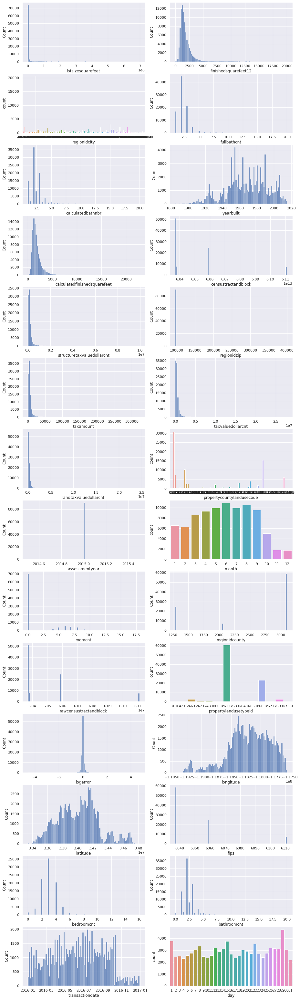

In [ ]:
fig, axes = plt.subplots(nrows=14, ncols=2, figsize=(15, 56))

for i, feature_name in enumerate(informative_features.columns):
    ax = axes[i // 2, i % 2]
    if feature_name not in categorical_features:
        sns.histplot(data=informative_features, x=f'{feature_name}', ax=ax, bins=100)
    else:
        sns.countplot(data=informative_features, x=f'{feature_name}', ax=ax)

### Некоторые выводы

Из интересного можно отметить наличие у многих признаков ассиметрии влево и тяжелых правых хвостов - куда ж без них..

Можно отметить пониженную частоту транзакций `transactiondate` осенью и зимой, позже рассмотрим с чем это может быть связано. Пик приходится на лето и весну, рассмотрим позже. Так, высокие продажи весной могут могут включать немаловажный фактор того, интересуется ли покупатель тем, что течет ли крыша или нет, есть ли вода в подвале, никто не захочет иметь с этим дело, и это можно сразу проверить (после зимы, когда потеплеет).

Отсутствие нормально распределенных случайных величин (на глаз)

Биномиальное распределение у `bedroomcnt` - количества комнат

Некоторые распределения схожи с `lognormal`, `beta`, `gamma`, `weibull`, `exponential`, `johnsonsu`


**Более точно будет определять на этапе трансформации признаков**

## Distributions fitting

Для адекватного понимания рассмотренных распределений подберем наиболее подходящие им теоретические и оценим их параметры c помощью библиотеки **fitter**

https://fitter.readthedocs.io/en/latest/#

В качестве метрик выбраны следующие: **среднеквадратичное отлонение** `sumsquare error`, **Akaike information criterion** `(aic)` и **Bayesian information criterion** `(bic)` - критерий Шварца

Почитать о них можно здесь: \
https://en.wikipedia.org/wiki/Akaike_information_criterion \
https://en.wikipedia.org/wiki/Bayesian_information_criterion

In [ ]:
supposed_dists = ['lognorm', 'beta', 'gamma', 'weibull', 'expon', 'poisson', 'chi2', 'norm', 'johnsonsu']

## Univariate Analysis

### Transactions by months

Посмотрим на количество транзакций которые осуществлялись в каждом месяце

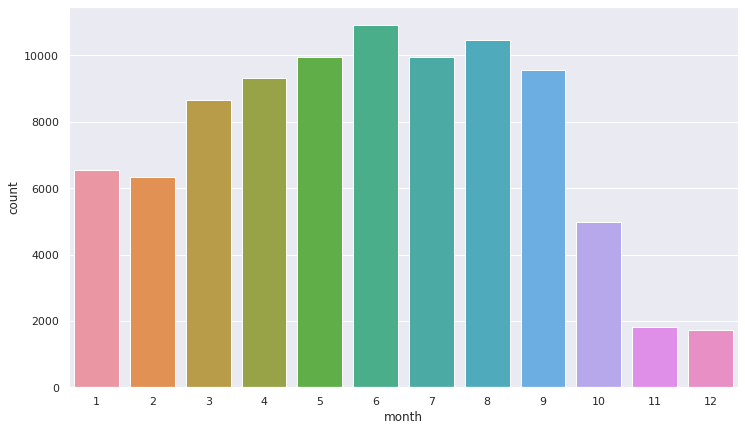

In [ ]:
sns.countplot(data=informative_features, x='month')

Большинство транзакций осуществлялось в конце весны и до начала сентября, затем их число значительно упало

Так, высокие продажи весной могут могут включать немаловажный фактор того, интересуется ли покупатель тем, что течет ли крыша или нет, есть ли вода в подвале, никто не захочет иметь с этим дело, и это можно сразу проверить (после зимы, когда потеплеет).

### Transactions by days

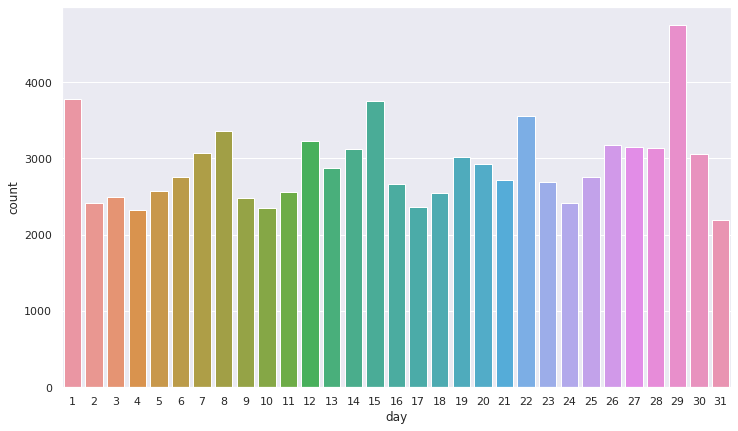

In [ ]:
sns.countplot(data=informative_features, x='day')

Транзакции осуществлялись приблизительно равномерно на протяжении всех 12 месяцев по дням. \
Стоит отметить, что большинство сделок юридически заключаются **по понедельникам**, скорее всего это связано с тем, что просмотр дома осуществлялся на выходных, а сделку решили оформить сразу после них.

### Parcel yearbuilt 

In [ ]:
px.box(informative_features, y='yearbuilt', color='regionidcounty')

Округ с id 3101 имеет более широкий размах по сравнению с остальными, и медиану, ниже чем у остальных, что свидетельствует о том, что дома в последних двух округах более новее. Для более строгого высказывания можно провести **однофакторный дисперсионный анализ** и выявить статистически значимые различия (если они есть) среди групп. Будет понятно, что если они будут, то различия будут у первого округа с остальными.

Также можно воспользоваться **непараметрическим критерием Манна-Уитни** для независимых выборок, но придется использовать поправку на множественное сравнение.

Можно воспользоваться **бутстрепом** и построить доверительный интервал для разности медиан округа 3101 и 1286, так и поступим

In [ ]:
def get_bootstrap_samples(data, n_samples):
    indices = np.random.randint(0, len(data), (n_samples, len(data)))
    samples = data[indices]
    
    return samples

def build_confint(stat_sample, alpha: float = .05):
    boundaries = np.percentile(stat_sample, [100 * alpha / 2, 100 * (1 - alpha / 2)])
    
    return boundaries

n_samples = 1000
alpha = 0.05

region_groups = informative_features[['yearbuilt', 'regionidcounty']].dropna()
blue_region_data = region_groups[region_groups['regionidcounty'] == 3101.0].yearbuilt.to_numpy()
red_region_data = region_groups[region_groups['regionidcounty'] == 1286.0].yearbuilt.to_numpy()

stat_sample_blue_region = np.array(list(map(np.median, get_bootstrap_samples(blue_region_data, n_samples))))
stat_sample_red_region = np.array(list(map(np.median, get_bootstrap_samples(red_region_data, n_samples))))
diff_stat_sample = stat_sample_blue_region - stat_sample_red_region

print(f'{100 - 100*alpha}% confint for blue region median year built: '
      f'{build_confint(stat_sample_blue_region ,alpha=alpha)}\n'
      f'\t\t\t  for red region: {build_confint(stat_sample_red_region, alpha=alpha)}\n')

print(f'Or, for difference between blue/red region samples: {build_confint(diff_stat_sample, alpha=alpha)}')

95.0% confint for blue region median year built: [1960. 1961.]
			  for red region: [1977. 1977.]

Or, for difference between blue/red region samples: [-17. -16.]


В 95% доверительный интервал для разности медиан двух групп не входит, значит, на уровне значимости 0.05 отклоняем нулевую гипотезу о равенстве медиан в двух группах, более того, медиана в 95% доверительном интервале для `красного` региона значительно больше. Точечная оценка -- -16.50625.

Смело можем сказать, что медианы синего региона в сравнении с остальными различаются статистически значимо.

### Guest Area

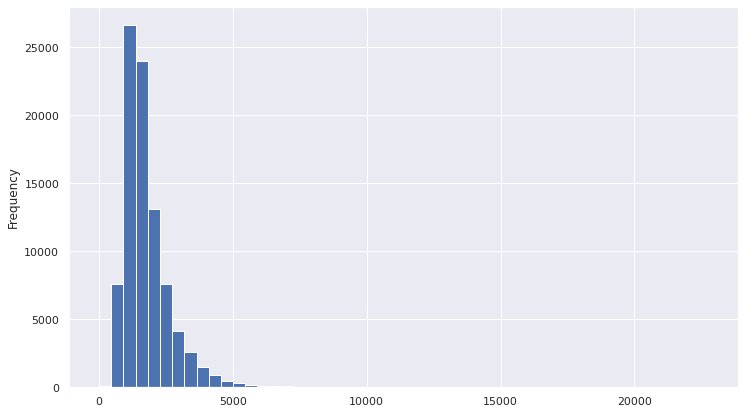

In [ ]:
df_train['calculatedfinishedsquarefeet'].plot(kind='hist', bins=50)

Распределение очень похоже на экспоненциальное и вейбулла, а также на johnsonsu

### Bedrooms

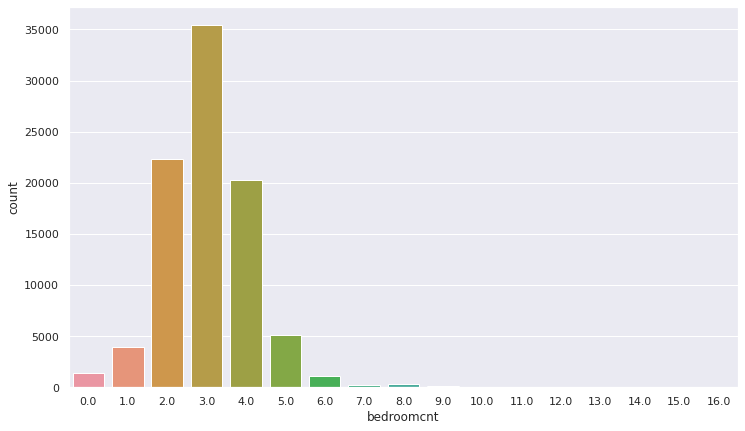

In [ ]:
sns.countplot(data=informative_features, x='bedroomcnt')

Видим, что большинство домов содержит от 2 до 4 комнат с пиком в 3 комнаты, распределение - биномиальное

### Bathrooms

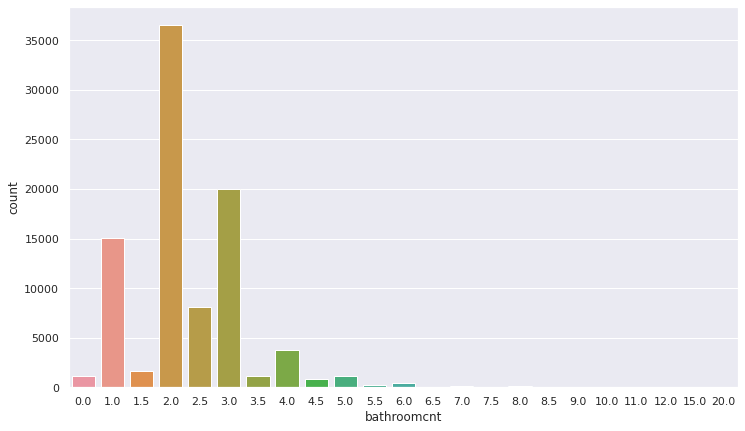

In [ ]:
sns.countplot(data=informative_features, x='bathroomcnt')

### Tax features

Рассмотрим распределения признаков, которые так или иначе связаны с налогом (на участок, общий налог на имущество за год и др.)

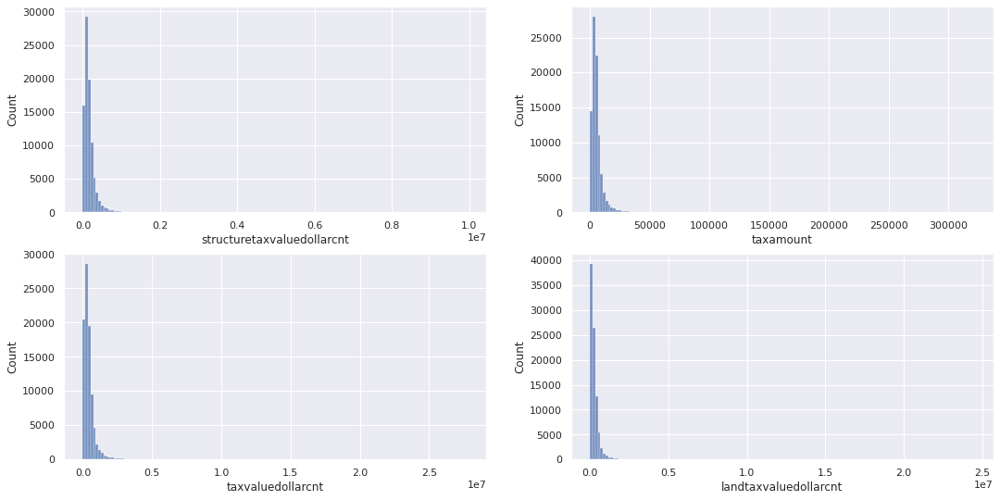

In [ ]:
tax_features = list(filter(lambda f_name: 'tax' in f_name, informative_features.columns))
fig, axes = plt.subplots(nrows=len(tax_features) // 2, ncols=len(tax_features) // 2, figsize=(18, 9))
count_bins = 150

for i, feature_name in enumerate(tax_features):
    sns.histplot(data=informative_features, x=f'{feature_name}', ax=axes[i // 2, i % 2], bins=count_bins)
    
plt.show()

Распределения очень похожи на **экспоненциальное**, а также на **johnsonsu**. \
В будущем, это нам понадобится для лучшего понимания того, как трансформировать признаки и затем масштабировать.

Да, если мы используем деревья, нам масштабирование будет не нужно, в связи с тем, что алгоритмы основаные на деревьях, а точнее вершины, делятся в соответствии с некоторым порогом на некотором критерии. В деревьях не используются градиентные методы оптимизации, где бы масштабирование было бы нужно.

In [ ]:
# supposed_dists = ['expon', 'johnsonsu']

# dist_fitter = Fitter(df_train['taxamount'].dropna(), distributions=supposed_dists)
# dist_fitter.fit()
# dist_fitter.summary()


# fig, axes = plt.subplots(nrows=len(tax_features) // 2, ncols=len(tax_features) // 2, figsize=(18, 9))
# for i, feature_name in enumerate(tax_features):
#     dist_fitter = Fitter(df_train[feature_name].dropna(), distributions=supposed_dists)
#     dist_fitter.fit()
#     dist_fitter.summary()

((array([-4.32350005, -4.12373781, -4.01504985, ...,  4.01504985,
          4.12373781,  4.32350005]),
  array([ 3.89345162,  3.93963817,  4.15888308, ..., 12.63026084,
         12.64775418, 12.68210833])),
 (0.7557306214057715, 8.393174661178158, 0.9952504393114401))

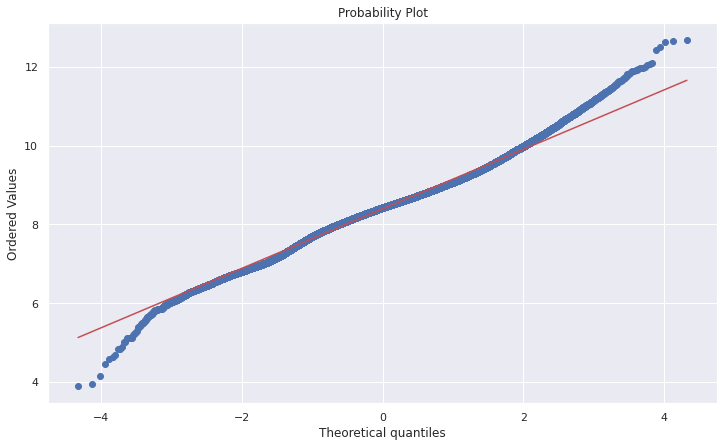

In [ ]:
sts.probplot(np.log(informative_features['taxamount'].dropna()), plot=plt)

Ни один признак по налогу не следует нормальному распределению, с которым удобно работать. Поэтому будет необходимо преобразовать (трансформировать) данные признаки.

## Bivariate Analysis

Рассмотрим 95% доверительные интервалы по общей налоговой оценочной стоимости участка в зависимости от города в разных округах

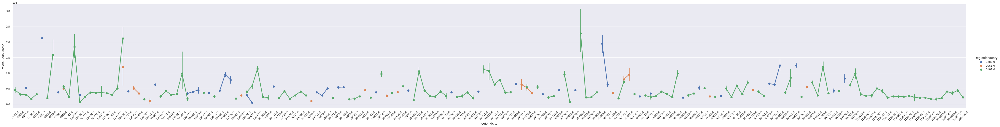

In [ ]:
sns.catplot(data=informative_features, x='regionidcity', y='taxvaluedollarcnt', hue='regionidcounty', kind='point', height=7, aspect=8,)
plt.xticks(rotation=45)
plt.show()

Можно проследить, в округе с id 3101.0 общий налог (95% доверительный интервал для среднего) `taxvaluedollarcnt` во многих городах зачастую выше, чем в других округах. Это может быть связано с тем, что там более высокий уровень жизни.

#### Insight
Наличие предприятий, крупных фирм, туристических мест (туда, куда многие стремятся, много желающих) очень сильно влияет на размер налогов и арендной платы, соответственно там будут выше зарплаты. Чем выше размер зарплаты, тем выше будет арендная ставка. И чем выше будет спрос, тем выше будет та же арендная ставка.

### HeatingSystemType

Посмотрим на тип отопления в различных округах

In [ ]:
pd.crosstab(index=df_train['regionidcounty'], columns=df_train['heatingorsystemtypeid'], dropna=True)

heatingorsystemtypeid,1.0,2.0,6.0,7.0,10.0,11.0,12.0,13.0,14.0,18.0,20.0,24.0
regionidcounty,,,,,,,,,,,,
1286.0,13,0,970,35,2,1,1,76,2,25,0,1071
3101.0,0,38303,0,15484,0,0,0,0,0,0,97,0


Видно, что большинство домов в округе с id 3101.0 имеют центральное отопление, следом по количеству идет отопление стен/пола. \
В округе с id 1286.0 достаточно много пропусков -- 91%, но здесь мы видим, что у большинства воздушное отопление. Как известно, оно же является одним из самых старых. \
О третьем округе информация полностью отсутствует.

Дальнейший анализ будет осуществляться на признаках, имеющие менее 80% пропусков

In [ ]:
features = missing[missing.percent < 0.8].index
considered_features = df_train[features]

### Pairwise relationships

Посмотрим на характер взаимосвязи между факторами. В связи с тем, что они могут не отображать **причинно-следственные связи** даже при условии отсутствия выбросов (если говорим, например, про коэф. корреляции Пирсона, то наличие выбросов **может 'убить' адекватность** значения) -- может существовать, например, **ложная корреляция**, когда два фактора обуславливаются третьим, который не всегда очевиден и которого мы не знаем. Либо наблюдаемая взаимосвязь **могла возникнуть случайно** (**эффект множественных сравнений** -> повышение ошибки первого рода)

Поэтому, `scatter matrix` можно использовать в качестве получения полезной информации для дальнейшего анализа, понимания данных и построения модели. \
А `heatmap`, местами для отбора признаков, где-то для обнаружения мультиколлинеарности и ее устранения для предотвращения переобучения.


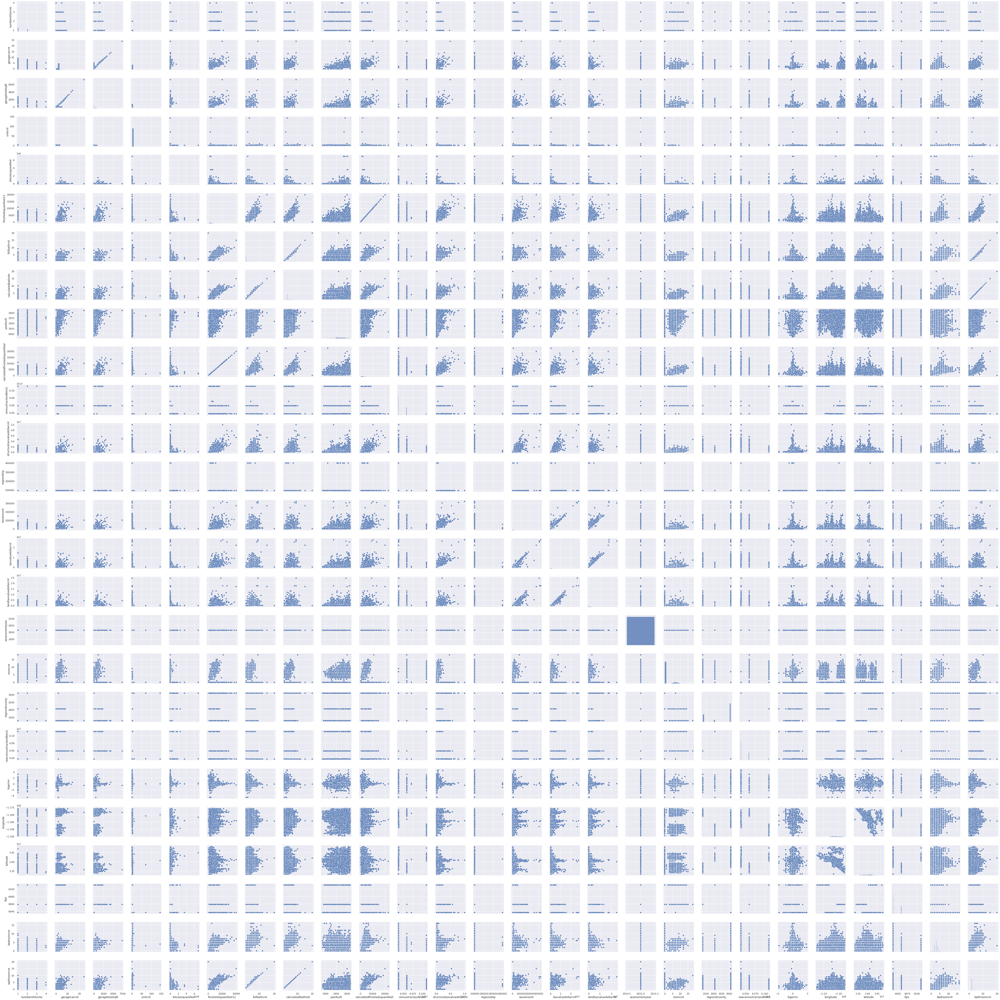

In [ ]:
sns.pairplot(considered_features)

#### Some usefull observations


1) В целом, прослеживается сильная линейная взаимосвязь между факторами смежного характера, например, `garagecarcnt`/`garagetotalsqft`, очевидно что с ростом кол-ва гаражей будет расти их общая площадь. Либо `fullbathcnt`/`finishsquarefeet12` - тоже очевидно, что чем больше "полных ванн", тем больше общая площадь. С такими переменными нужно работать: либо их как-то совмещать (**feature engineering**), либо от какой-то избавляться дабы понизить **мультиколлинеарность**. Например, в эконометрике избавляются от той переменной, которая при сильной линейной взаимосвязи с целевой переменной имеет наиболее высокую взаимосвязь с факторами (независимыми переменными).

2) Наблюдаются характерные выбросы (двумерные, а есть же еще n-мерные), от которых нужно избавляться (риск переобучения модели, модель будет на них настраиваться при соответствующей функционале, например MSE)

3) Есть нелинейные взаимосвязи. Целевая переменная `logerror` на глаз имеет фактически **одинаковую** нелинейную взаимосвязь (в виде елки -> симметричя относительно T ~ 0) с другими факторами в виде смеси прямой и обратной пропорциональности с некоторыми $k_1, k_2$, которые близки по абсолютному значению $ → k_1*x, \frac {k_2}{x}$ и разделяющий их порог T ~ 0. Cначала, увеличение одной переменной ведет к увеличению другой в k1 раз, а затем, достигая некоторого пика (порог T), увеличение той же переменной ведет к понижению другой в $k_2$ раз, причем $|k_1| - |k_2| < eps$.

**ВАЖНЫЙ НЮАНС:**
Также можно отметить, что разброс целевой переменной, с большего, уменьшается когда лот стоит **дороже**, имеющий больше привилегий в виде дополнительного кол-ва комнат, либо же ванных комнат, большей площади земельного участка и тд.
В связи с тем, что стоит задача предсказания разницы между ценой на сайте (которая получена из 60+ к. моделей) и фактической ценой продажи (сделки) и глядя на распределения целевой переменной и ее взаимосвязь с остальными факторами - можно сделать вывод, что оценить более дорогие дома у компании получается лучше, чем те, которые обладают более высокой вариативностью и более низкой ценой (меньшими 'привилегиями'). Это может быть связано с тем, что на более низкий лоты всегда идет торг со стороны покупателя и фактически невозможно точно предсказать разницу. Всегда найдется Вася Пупкин, который договорится и купит дешевле, либо же согласится переплатить. А на дорогие лоты менее интенсивный торг может быть обусловлен богатыми дядями, которым, например, хочется быстрее завладеть имуществом, поэтому он и соглашается на цену, указанную на сайте, которая предсказана моделями компании.

4) Наличие **гетероскедантичности**. Проверку на которую сделаю после построения модели по остаткам для того, чтобы понять: правильно ли выстроен характер взаимосвязи которую отображает модель.

5) Отсутствие характерной взаимосвязи между некоторыми парами факторов, что делает их более **независимыми**. Если такие факторы еще имеют сильную взаимосвязь с целевой переменной, то они обязательно должны присутствовать в модели.

### Mean log error by months

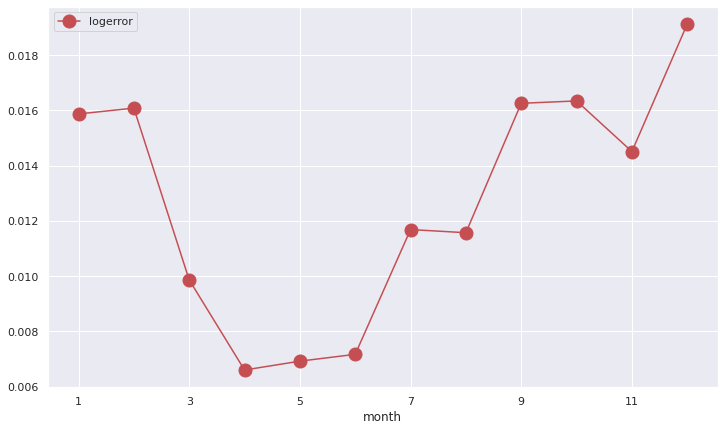

In [ ]:
considered_features.groupby('month').agg({'logerror': np.mean}).plot(marker='o', markersize=13, color='r', figsize=(12, 7))

Видим, что у компании хорошо получалось предсказывать среднюю ошибку продажи в летние месяцы, и плохо ближе к зиме

### Mean abs log error by months

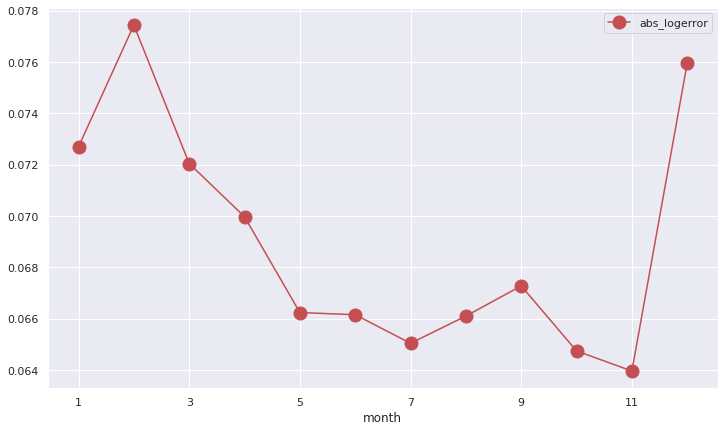

In [ ]:
considered_features['abs_logerror'] = considered_features['logerror'].map(np.abs)
plot = considered_features.groupby('month').agg({'abs_logerror': np.mean}).plot(marker='o', markersize=13, color='r', figsize=(12, 7))

А вот с абсолютной ошибкой по-другому. Плохо получалось предсказывать в начале и в конце года

### Latitude/longtitude

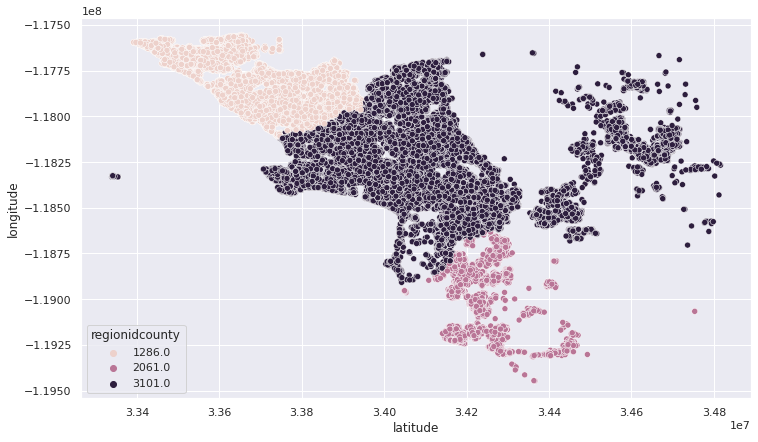

In [ ]:
sns.scatterplot(data=informative_features, x='latitude', y='longitude', hue='regionidcounty')

### Squarefeet/tax of the parcel

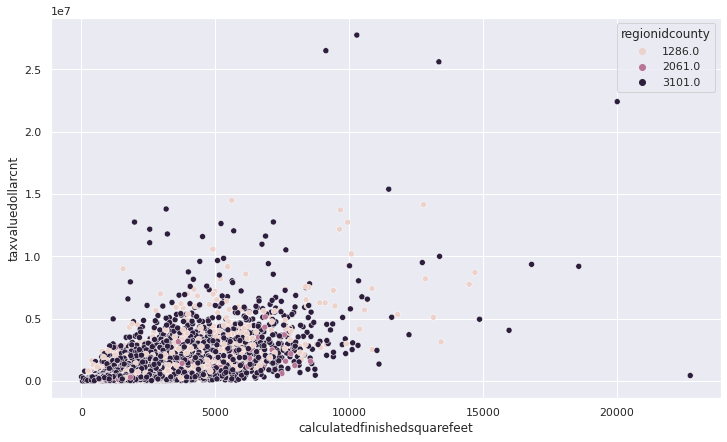

In [ ]:
sns.scatterplot(data=informative_features, x='calculatedfinishedsquarefeet', y='taxvaluedollarcnt', hue='regionidcounty')

# Missing values

## Description and stategy

Перед тем как заполнять пропуски нужно определить **механизм формирования пропусков**: **MAR**, **MCAR**, **MNAR** а уже затем обрабатывать. \
Есть достачное количество методов заполнения пропусков, я перечислю лишь некоторые:

++
1) `Удаление записей либо признаков`. Можно пользоваться когда размер выборки велик, и есть гарантия того, что мы не внесем искажения в статистический свойства выборки. Хотя зависит от конкретного механизма фп: в случае с MCAR применение данного метода не приведет к существенному искажению параметров модели, но если удалять строки, то могут возрасти стандартные отклонения, выборка становится менее репрезентативной.

+/-- (Константы) \
2) `Заполнение мерами центральной тенденции (групповая/нет)`. Предварительно проанализировав что будет уместным. Вносит искажение в статистические свойства выборки, искусственно может завышать/занижать корреляцию, искажать исходное распределение, например.

3) `Заполнение константой (0 и др)`. Хорошо использовать в категориальных данных по очевидным причинам (мало градаций), но может исказить корреляцию, так как такой метод не учитывает ее, поэтому может породить несостыковку

`Случайное заполнение` \
4) Различные модели: деревья, леса, лог. регрессия и др.

`Многомерные условия (для более низкого внесения искажения в выборку)` \
4) Используя регрессионные модели на n признаках, из минусов то, что данный свойственен некоторый разброс, поэтому можно использовать регрессионные модели с разбросом. Минус - нет реализации с разбросом, поэтому если использовать то писать с нуля. Чувствительны к выбросам, которые не обработаны еще.

5) k-NN

6) MICE

1. Пропуски будут заполняться вышеуказанными методами для сравнения их качества на основании выбранной метрики (Sd or MAE/MSE)
2. 3 основных этапа: до 15%, 15%-40%, 40%-80% пропусков, >80% не рассматриваются
3. Список моделей для всех частей (выбор)
3. Модель строится на всех признаках из своей части и предыдущих, если они есть
4. Для числовых признаков - выбранная регрессионная модель, для категориальных - выбранный классификатор
5. Сначала заполняются пропуски в числовых, потом категориальных признаках
6. Измеряется качество на каждой части и выбираются лучшие модели (визуализация - кросс-валидация на регрессии с l1-morm) 
7. Переход к следующей части, если она есть

Так как в качестве моделей для заполнения будут использованы `BayesianRidge` и `xgboost`, то нужно подобрать параметры для более осмысленного заполнения.

`xgboost`:
1. Выборка (с пропусками) делится на 2 части в соотношении 88/12

2. Кросс-валидация в 6 фолдов

3. на 88% подбираем параметры (в 6 фолдов), на 12% можем проверять

4. В качестве параметров берем лучшие и заполняем пропуски.

\
`BayesianRidge`:
Здесь я возьму дефолтные параметры

### Choice
В связи с тем, что я не хочу внести искажения в статистические свойства выборки - искусственное завышение/занижение корреляции, изменение распределений и др. Одномерные методы не являются рациональными, кроме тех, которыми заполняют категориальные признаки c наименьшим кол-вом пропусков. k-NN не подходит для категориальных признаков. 
Будет использована алгоритм MICE на RidgeRegression (хорошо работает) и на градиентном бустинге `xgboost`, `lightgbm`.

+ Удаление записей либо признаков в 0 части
+ Заполнение константой в категориальных признаках (с наименьшим кол-вом пропусков) в 1 части
+ MICE with lightgbm, xgboost, and random forest that can recovery general mean

## Missing step imports

In [ ]:
import miceforest as mf
import xgboost as xgb

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor

from sklearn.linear_model import Lasso, Ridge, BayesianRidge

from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import Normalizer, StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
def missing_part(percent):
    if 0.0 <= percent < 0.15:
        return 1
    elif 0.15 <= percent < 0.4:
        return 2
    elif 0.4 <= percent < 0.8:
        return 3
    else:
        return 'delete'

missing['part'] = missing['percent'].apply(missing_part)
missing.head()

,percent,feature_type,part
buildingclasstypeid,0.999823,c,delete
finishedsquarefeet13,0.999634,n,delete
storytypeid,0.999524,c,delete
basementsqft,0.999524,n,delete
yardbuildingsqft26,0.998948,n,delete


In [ ]:
N_SPLITS = 6
param_comb = 5

all_features = considered_features.copy()

X_train = all_features.drop(['logerror', 'transactiondate',
                             'day', 'month',
                             'propertyzoningdesc', 'propertycountylandusecode'], axis=1)
y_train = all_features['logerror'].values

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5],
        'eta': [0.01, 0.02],
        }

xgb_model = xgb.XGBRegressor(n_estimators=600, objective='reg:linear',
                        silent=True, nthread=1, eval_metric='mae')
kf = KFold(n_splits=N_SPLITS, shuffle=True, random_state=0)

random_search = RandomizedSearchCV(xgb_model,
                                   param_distributions=params,
                                   n_iter=param_comb,
                                   scoring='neg_mean_absolute_error',
                                   n_jobs=-1,
                                   cv=kf.split(X_train, y_train),
                                   verbose=3,
                                   random_state=0)
random_search.fit(X_train, y_train)

In [ ]:
random_search.best_score_, random_search.best_estimator_, random_search.best_params_

(-0.06820642203941925, \
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0, enable_categorical=False,
              eta=0.02, eval_metric='mae', gamma=2, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.0199999996, max_delta_step=0, max_depth=3,
              min_child_weight=10, missing=nan, monotone_constraints='()',
              n_estimators=600, n_jobs=1, nthread=1, num_parallel_tree=1,
              objective='reg:linear', predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, silent=True,
              subsample=0.8, ...),
 \
 {'subsample': 0.8,
  'min_child_weight': 10,
  'max_depth': 3,
  'gamma': 2,
  'eta': 0.02,
  'colsample_bytree': 1.0})

## Imputing by MICE (iterative imputer)
### xgboost, BayesianRidge, ExtraTrees

In [ ]:
# Estimate the score on the entire dataset, with no missing values

features = considered_features.copy()
features.drop(['transactiondate', 'day', 'month'], axis=1, inplace=True)

temp_df = considered_features.copy()
temp_df.dropna(how='any', inplace=True)

features_df_no_missing = pd.get_dummies(temp_df)
features_df_missing = pd.get_dummies(features)

X_no_missing = features_df_no_missing[features_df_no_missing.columns[~features_df_no_missing.columns.isin(['logerror'])]]
y_no_missing = features_df_no_missing['logerror']

X_missing = features_df_missing[features_df_missing.columns[~features_df_missing.columns.isin(['logerror'])]]
y_missing = features_df_missing['logerror']

br_estimator = BayesianRidge()
br_pipeline = make_pipeline(StandardScaler(), br_estimator) 

# Mice algo with sklearn -- Iterative Imputer on different algorithms
regression_models = {
    'xgboost': xgb.XGBRegressor(**random_search.best_params_),
    'bayesianRidge': br_estimator,
    'ExtraTrees': ExtraTreesRegressor(n_estimators=200, criterion='absolute_error', bootstrap=True, random_state=0, n_jobs=-1),
}

score_iterative_imputer = dict()

start_time = time.time()

for model_name, impute_reg_model in regression_models.items():
    print(f'Starting doing for {model_name}')
    print('Iterative imputer is working...')
    imputer = IterativeImputer(estimator=impute_reg_model,
                               max_iter=12,
                               imputation_order='ascending',
                               initial_strategy='mean',
                               random_state=0)
    
    
    print('Init pipeline...')
    
    estimator = None
    if model_name == 'bayesianRidge':
        estimator = make_pipeline(
            imputer,
            StandardScaler(),
            br_estimator,
        )
        
    else:
        estimator = make_pipeline(
            imputer,
            br_estimator,
        )
    
    
    print('Starting cross-validation...')
    score_iterative_imputer[model_name] = cross_val_score(
        estimator, X_missing, y_missing, scoring='neg_mean_absolute_error', cv=N_SPLITS
    )
    print(score_iterative_imputer[model_name])

print("--- %s seconds for loop ---" % (time.time() - start_time))

score_iterative_imputer

## MICE by miceforest on lightgbm

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

def undummify(df: pd.DataFrame, prefix_sep: str = '_') -> pd.DataFrame:

    cols2collapse = {
        item.split(prefix_sep)[0]: (prefix_sep in item) for item in df.columns
    }
    series_list = []
    for col, needs_to_collapse in cols2collapse.items():
        if needs_to_collapse:
            undummified = (
                df.filter(like=col)
                    .idxmax(axis=1)
                    .apply(lambda x: x.split(prefix_sep, maxsplit=1)[1])
                    .rename(col)
            )
            series_list.append(undummified)
        else:
            series_list.append(df[col])

    undummified_df = pd.concat(series_list, axis=1)

    return undummified_df

class FastMiceTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, imp_kernel_params: dict, mice_params: dict):
        super().__init__()
        self.imp_kernel_params = imp_kernel_params
        self.mice_params = mice_params

        self.impute_kernel = None

    def transform(self, data: pd.DataFrame):
        data_ = data.copy()

        if not self.impute_kernel:
            self.impute_kernel = mf.ImputationKernel(data_, **self.imp_kernel_params)

        self.impute_kernel.mice(**self.mice_params)

        # average all across datasets
        datasets_list = (self.impute_kernel.complete_data(dataset=ds_idx, iteration=self.impute_kernel.iteration_count())
                         for ds_idx in range(self.imp_kernel_params['datasets']))

        # get final dataset
        imputed_ds = FastMiceTransformer.build_final_imputed_dataset(*datasets_list)

        return imputed_ds

    @staticmethod
    def build_final_imputed_dataset(*args) -> pd.DataFrame:
        concatenated_ds = pd.concat([*args])
        by_row_index = concatenated_ds.groupby(concatenated_ds.index)

        imputed_ds = by_row_index.mean()
        final_imputed_ds = undummify(imputed_ds)

        return final_imputed_ds


class SemiDtypeFeaturesRounder(BaseEstimator, TransformerMixin):
    def __init__(self, *, semi_features: list, decimals: int = 0):
        super().__init__()
        self.__semi_features = semi_features
        self.__decimals = decimals

    def fit(self):
        return self

    def transform(self, data):
        data_ = data.copy()
        how = [self.__decimals] * len(self.__semi_features)
        round_info = dict(zip(self.__semi_features, how))
        rounded_data = data_.round(decimals=round_info)

        # convert dtypes to the most suitable
        rounded_data = rounded_data.convert_dtypes()

        return rounded_data

Transformer test

In [ ]:
df = considered_features.drop(['transactiondate', 'propertyzoningdesc'], axis=1)
df = pd.get_dummies(df)

imp_kernel_params = {'datasets': 3, 'save_all_iterations': True, 'random_state': 0, 'copy_data': False}
mice_params = {'iterations': 13, 'min_sum_hessian_in_leaf': 0.01}

mf_transformer = FastMiceTransformer(imp_kernel_params=imp_kernel_params, mice_params=mice_params)

start_time = time.time()
imputed_ds = mf_transformer.transform(df)
print(f"--- %s seconds imputing ---" % (time.time() - start_time))

--- 2971.18003821373 seconds imputing ---


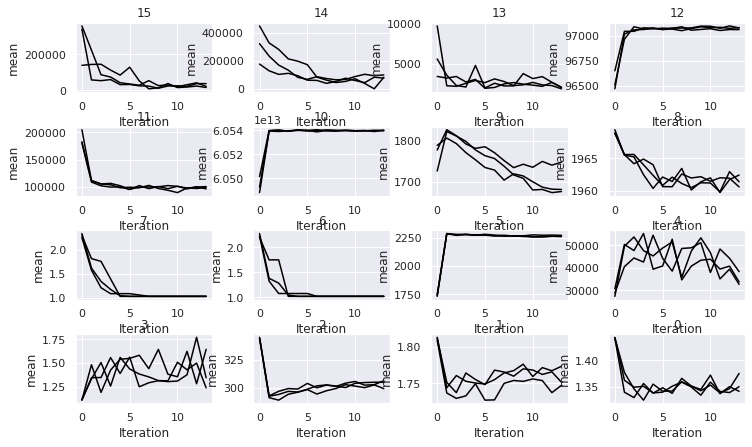

In [ ]:
mf_transformer.impute_kernel.plot_mean_convergence(wspace=0.3, hspace=0.5)

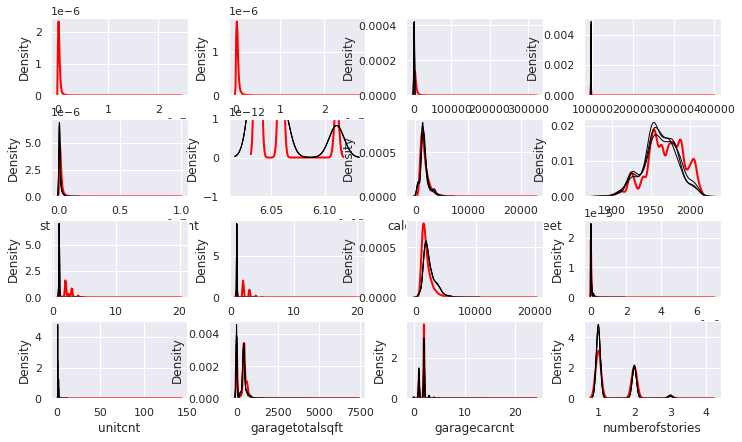

In [ ]:
mf_transformer.impute_kernel.plot_imputed_distributions(wspace=0.3,hspace=0.3)

In [ ]:
# df = considered_features.drop(['transactiondate', 'propertyzoningdesc'], axis=1)
# df = pd.get_dummies(df)

# iters = 13
# datasets = 3
# mf_kernel = mf.ImputationKernel(df,
#                                 datasets=datasets,
#                                 save_all_iterations=True,
#                                 random_state=0,
#                                 copy_data=False)
    
# start_time = time.time()

# mf_kernel.mice(iters, min_sum_hessian_in_leaf=0.01)

# print(f"--- %s seconds imputing {iters} iters ---" % (time.time() - start_time))

# print(mf_kernel)

--- 3106.7343652248383 seconds imputing 13 iters ---
              Class: ImputationKernel
           Datasets: 3
         Iterations: 13
  Imputed Variables: 16
save_all_iterations: True


Можем наблюдать сходимость среднего, что было и нужно, так как основной задачей было восстановление среднего :)

Возьмем датасеты на последней итерации и усредним для получения финального, затем обратим one-hot encoding для дальнейшей обработки

Обратим encoding и округлим переменные типа int (только!) до целого (c точностью до целого)

In [ ]:
round_features = ['numberofstories', 'garagecarcnt', 'unitcnt', 'calculatedbathnbr', 'fullbathcnt', 'yearbuilt',
                 'regionidzip', 'assessmentyear', 'roomcnt', 'regionidcounty', 'fips', 'bedroomcnt', 'bathroomcnt']


rounder = SemiDtypeFeaturesRounder(semi_features=round_features)
rounder.fit()

imputed_ds = rounder.transform(imputed_ds)

In [ ]:
imputed_ds.isna().sum().max()

0

Пропуски заполнены

# Cheching for a duplicates

В данных могут быть повторяющиеся записи, что может снижать производительность модели, так как **порождает смещение (bias)** в модели.
`Bias` - это разница между истинным характером взаимосвязи и предсказанным нашей моделью. Иными словами - это разница между истинным прогнозом и прогнозом модели.

In [ ]:
imputed_ds[imputed_ds.duplicated(keep=False)]

,numberofstories,garagecarcnt,garagetotalsqft,unitcnt,lotsizesquarefeet,finishedsquarefeet12,fullbathcnt,calculatedbathnbr,yearbuilt,calculatedfinishedsquarefeet,censustractandblock,structuretaxvaluedollarcnt,regionidzip,taxamount,taxvaluedollarcnt,landtaxvaluedollarcnt,assessmentyear,roomcnt,regionidcounty,rawcensustractandblock,logerror,longitude,latitude,fips,bedroomcnt,bathroomcnt,airconditioningtypeid,regionidneighborhood,heatingorsystemtypeid,buildingqualitytypeid,regionidcity,propertycountylandusecode,month,propertylandusetypeid,day
4763,1,2,0.0,1,60530.0,1140.0,2,2,1987,1140.0,6.037462e+13,104753.0,96292,2791.3,224471.0,119718.0,2015,0,3101,6.037462e+07,0.045,-118142000,34167500,6037,3,2,1.0,274695.0,2.0,4.0,47019.0,010E,1,266.0,25
4765,1,2,0.0,1,60530.0,1140.0,2,2,1987,1140.0,6.037462e+13,104753.0,96292,2791.3,224471.0,119718.0,2015,0,3101,6.037462e+07,0.045,-118142000,34167500,6037,3,2,1.0,274695.0,2.0,4.0,47019.0,010E,1,266.0,25


In [ ]:
# get duplicated rows
duplicated_indexies = imputed_ds[imputed_ds.duplicated(keep='last')].index
# drop duplicated rows
imputed_ds.drop(duplicated_indexies, inplace=True)

In [ ]:
imputed_ds[imputed_ds.duplicated(keep=False)]

,numberofstories,garagecarcnt,garagetotalsqft,unitcnt,lotsizesquarefeet,finishedsquarefeet12,fullbathcnt,calculatedbathnbr,yearbuilt,calculatedfinishedsquarefeet,censustractandblock,structuretaxvaluedollarcnt,regionidzip,taxamount,taxvaluedollarcnt,landtaxvaluedollarcnt,assessmentyear,roomcnt,regionidcounty,rawcensustractandblock,logerror,longitude,latitude,fips,bedroomcnt,bathroomcnt,airconditioningtypeid,regionidneighborhood,heatingorsystemtypeid,buildingqualitytypeid,regionidcity,propertycountylandusecode,month,propertylandusetypeid,day


Дублей больше нет

# Anomaly detection

Вообще говоря, поиск аномалий - отдельная важная задача ML, требующая отдельного качественного рассмотрения. В рамках текущей задачи будут рассмотрены лишь некоторые приемы и алгоритмы.

Следующим шагом в построении пайплайна будет обработка выбросов.
Почему это важно? \
1) Настройка модели на выбросы $→$ переобучение (**bias/variance problem**) \
2) Нельзя доверять среднему, а соответственно статистическим гипотезам на основании среднего (t-критерий, доверительные интервалы на основании его (и ЦПТ) ибо se - стандартная ошибка среднего высчитывается по среднему) \
3) Нельзя доверять p_value. То мы принимали $H_0$, добавив выброс, уже с легкостью отклоняем $H_0$ и получаем ошибку 1-го рода... \
4) Ну вот например, не совсем корректное заполнение пропусков с помощью алгоритма MICE выше. Ибо там используется сходимость к среднему.. А среднее-то неробастное. Нужно было правильно подбирать алгоритм заполнения, что было сделано, так как деревья робастны к такому повороту. \
5) Аномалия убивает адекватность коэффициента корреляции, ему нельзя доверять (как и впрочем и без пропусков, так как он может не отображать причинно-следственные связи, да и есть ложная корреляция)

Короче много проблем с ними...


Методов детекции много, вот некоторые из них: \
1) По стандартному отклонению смотреть (норм-ое распр-ие) \
2) Boxplot \
3) Dbscan clustering \
4) Isolation forest \
5) Robust random cut forest \
6) На моделях, например SVM и другие \
7) Статистические тесты \
8) KNN и др. \

Стоит отметить, что выбросы бывают **2 типов**: одномерные (нерационально их фиксить), многомерные (то, что будем делать) \

Библиотека, реализующая методы выше `pyod` \
Также можно пользоваться `sklearn` \


Как проверять на адекватность найденных аномалий? \
Можно валидироваться после удаления аномалий по некоторому методу, и смотреть на метрику, можно эвалуэйтить на тест сете. \

Можно взять несколько алгоритмов поиска, осуществить поиск каждым и удалить те выбросы, за которых больше всего голосов. \

Алгоритм на нескольких видах алгоритмов поиска \
https://www.andrew.cmu.edu/user/yuezhao2/papers/21-mlsys-suod.pdf

## Algorithm choice 

Так как одномерные методы не обладают достаточной точностью и малоэффективны, будут использоваться методы поиска многомерных выбросов.

**Isolation forest** \
Хороший алгоритм поиска. \
Вкратце, для каждого наблюдения строится бинарное дерево, ищется число разбиений, по которому можно отделить одну точку от остальных. Так для каждой точки. Точки с **наименьшим** числом разбиений - выбросы.

**Минусы**: \
1) Плохо работает когда пространство высокой размерности и мало данных (**Проклятие размерности** - будут затрагиваться и не аномалии, которые будут считаться аномалиями) \
2) "заболачивание" леса изоляции (равномерное распределение точек в пространстве, привдедет к тому, что алгоритм будет относить нормальные наблюдения к выбросам) - можно использовать **Extended Isolation Forest**, который будет решать эту проблему \


**Local Outlier Factor**

**Histogram-based Outlier Score**

**KNN**

**Copula-Based Outlier Detection**


And final, that average all detectors higher (paper: https://www.andrew.cmu.edu/user/yuezhao2/papers/21-mlsys-suod.pdf): \
**Accelerating Large-scale Unsupervised Heterogeneous Outlier Detection (Acceleration)**

SUOD будет являться обобщающим методом при посроении решения детекции выбросов. Будет объединять в себе вышеуказанные алгоритмы и строить композицию.

## Import libraries

In [ ]:
from sklearn.ensemble import IsolationForest
from pyod.models.lof import LOF
from pyod.models.hbos import HBOS
from pyod.models.knn import KNN
from pyod.models.iforest import IForest
from pyod.models.copod import COPOD
from pyod.models.suod import SUOD
from pyod.models.rod import ROD

from joblib import dump, load

## Reading data after detecting anomalies

В связи с долгими вычислениями они опускаются

In [ ]:
imputed_ds_c = pd.read_csv('/content/drive/MyDrive/Kaggle_competitions/Zillow/after_imputing.csv')

for feature_name in imputed_ds_c.columns:
    if feature_name in categorical_features:
        imputed_ds_c[feature_name] = imputed_ds_c[feature_name].astype('category')
        
imputed_ds_c = imputed_ds_c.convert_dtypes()

data_to_detect_anomalies = pd.get_dummies(imputed_ds_c.drop('logerror', axis=1))

In [ ]:
LOF_detectors = [LOF(n_neighbors=n_neighbors, algorithm='auto') for n_neighbors in [20, 25]]
HBOS_detectors = [HBOS(n_bins='auto', contamination=treshold) for treshold in [0.1, 0.2]]
KNN_detetors = [KNN(n_neighbors=n_neighbors, method='largest') for n_neighbors in [10, 15]]
IForest_detectors = [IForest(n_estimators=150, max_samples='auto', contamination=treshold, random_state=0)
                    for treshold in [0.1, 0.125] ]
COPOD_detectors = [COPOD(contamination=treshold) for treshold in [0.1, 0.125]]

detector_list = [*LOF_detectors, *HBOS_detectors, *IForest_detectors]

final_detector = SUOD(base_estimators=detector_list, n_jobs=-1, contamination=0.1, combination='average', verbose=False)

In [ ]:
# final_detector.fit(X_train)
# final_detector = load('../input/suod-detector/SUOD_detector.joblib')
# final_detector = load(detector_path)

Вычеслиния опускаются, подгружаются результаты

In [ ]:
# outlier_labels, confidence = final_detector.predict(data_to_detect_anomalies, return_confidence=True)

import pickle
with open('/content/drive/MyDrive/Kaggle_competitions/Zillow/data.outlier_labels', 'rb') as outl_f, \
     open('/content/drive/MyDrive/Kaggle_competitions/Zillow/data.confidence', 'rb') as conf_f:
    outliers_labels, confidence = pickle.load(outl_f), pickle.load(conf_f)

In [ ]:
outlier_indexies = np.where(outliers_labels == 1)[0]

print(f'Outliers count: {len(outlier_indexies)}\n'
      f'Outliers percentage: {len(outlier_indexies) / len(imputed_ds_c)}')


Outliers count: 9028
Outliers percentage: 0.10000664643197377


Видим, что найдено 9028 аномалий,  что составляет 10% от всей выборки. Удалим их по индексу.

In [ ]:
after_outliers_data = imputed_ds_c.drop(outlier_indexies, axis=0, inplace=False)

# Multicollinearity

После того, как выбросы удалены, можно построить heatmap и посмотреть на попарную корреляцию факторов. Корреляция может не отображать причинно-следственные связи как упоминалось ранее, но может показать: имеем ли мы дело с **мультиколлинеарностью** или нет. Нужно ли от нее избавляться или нет.

Стоит отметить, что в реальных данных мультиколлинеарность - нередкое явление, и плоха она тем, что оценки на параметры будут нестабильными (**смещенными**) и модель будет настраиваться на **шум**, порожденный **коллинеарными** признаками что приведет к **переобучению**.

Построим матрицу попарной корреляции между числовыми факторами.

`Для числовых` можно использовать **коэффициент корреляции Пирсона**, благо выбросы удалены, но вообще говоря, желательно чтобы данные следовали нормальному распределению (**условие применимости**).

**коэффициент корреляции Пирсона** улавливает только **линейную** зависимость, поэтому это еще одно 'против' доверять значению coef corr.
 
`Для категориальных(не порядковых)` вообще говоря нужно использовать **коэффициент V Крамера**, используя который, можно проверять различные гипотезы с категориальными данными.

`Для категориальных(порядковых)` можно использовать **коэффициент корреляции Спирмена**, который учитывает порядок.

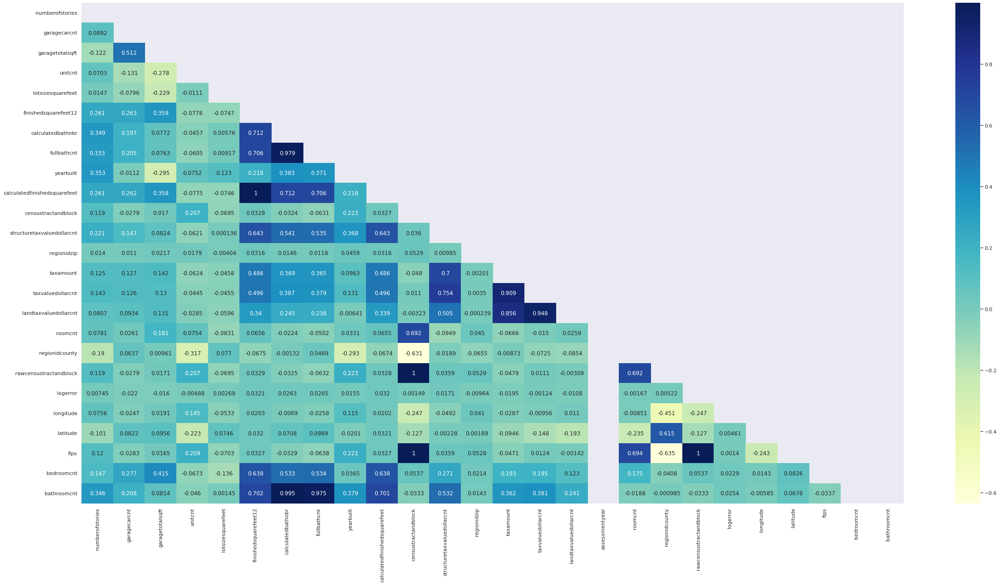

In [ ]:
sns.set(rc={'figure.figsize': (40, 20)})
numerical_data = after_outliers_data[after_outliers_data.columns[after_outliers_data.columns.isin(numerical_features)]]
pearson_corr = numerical_data.corr().dropna(how='all')

mask = np.triu(np.ones_like(pearson_corr))

sns.heatmap(data=pearson_corr, cmap='YlGnBu', annot=True, mask=mask, fmt='.3g')

Вот например мы видим, что корреляция с целевой переменной `logerror` с остальными факторами нулевая, но на самом деле она **нелинейная**. \
Поэтому этим коэффициентам верить нельзя.

Сделать это можно двумя способами:
1) Вручную удалить факторы, которые при сильной взаимосвязи с зависимой переменной сильно коррелируют с независимыми (**>= 0.7**) \
2) Автоматически избавиться с помощью **l1,l2-norm (регуляризации l1, l2 - отбор признаков, ограничение на веса)**

Но делать этого мы конечно же **не будем**, так как можно было видеть ранее, что многие взаимосвязи нелинейные, и доверять коэффициентам нельзя.

# Feature engineering

In [ ]:
after_outliers_data[['latitude', 'longitude']] = after_outliers_data[['latitude', 'longitude']] / 10**6
after_outliers_data['censustractandblock'] = after_outliers_data['censustractandblock'] / 10**12
after_outliers_data['rawcensustractandblock'] = after_outliers_data['rawcensustractandblock'] / 10**6

# Большинство транзакций как можно было видеть выше оcуществляются сразу после выходных
after_outliers_data['is_monday'] = after_outliers_data['day'].apply(lambda day: 1 if day == 1 else 0).astype('category')

after_outliers_data['transactiondate'] = pd.to_datetime(dict(year=imputed_ds_c.year, month=imputed_ds_c.month, day=imputed_ds_c.day))
after_outliers_data['is_weekend'] = after_outliers_data['transactiondate'].dt.weekday.apply(lambda day: 1 if day in (5, 6) else 0).astype('category')


# living area proportions 
after_outliers_data['living_area_prop'] = after_outliers_data['calculatedfinishedsquarefeet'] / after_outliers_data['lotsizesquarefeet']
# tax value ratio
after_outliers_data['tax_value_ratio'] = after_outliers_data['taxvaluedollarcnt'] / after_outliers_data['taxamount']
# tax value proportions
after_outliers_data['tax_value_prop'] = after_outliers_data['structuretaxvaluedollarcnt'] / after_outliers_data['landtaxvaluedollarcnt']

# Feature transformation

Для более удобной работы и построения моделей нужно признаки трансформировать, чтобы они они были более 'нормальными'. Для этого нужно понять, с какими распределениями мы имеем дело, понимая это, понимаем как трансформировать их для того, чтобы они больше следовали нормальному распределению.

На практике, на маленьких выборках гипотеза $H_0$ о нормальности почти всегда принимается, а на больших - отклоняется.



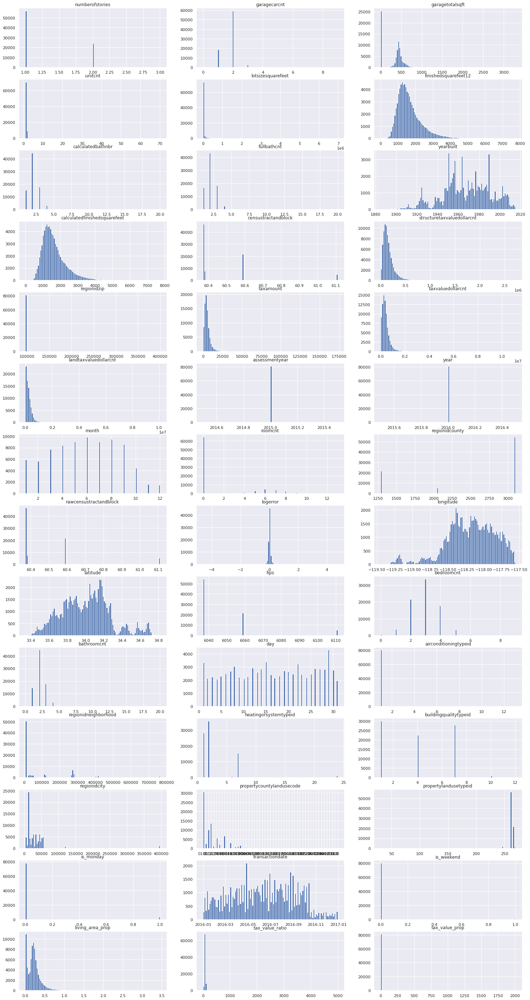

In [ ]:
_, ax = plt.subplots(nrows=14, ncols=3, figsize=(25, 50))

for i, feature_name in enumerate(after_outliers_data.columns):
    ax[i // 3, i % 3].hist(after_outliers_data[feature_name], bins=110)
    ax[i // 3, i % 3].set_title(f'{feature_name}')

In [ ]:
def distribution_fit(data: pd.Series, dist_names: list) -> list:
    
    class FitResult(tp.NamedTuple):
        dist_name: str
        ktest_statistic: float
        k_test_p_value: float

    fit_results = []
    
    data = data.to_numpy().astype('float')
    
    for dist_name in dist_names:
        print(dist_name)
        dist = getattr(sts, dist_name)
        dist_params = dist.fit(data)
        k_test_stats = sts.kstest(data, dist_name, args=dist_params)

        statistic, p_value = k_test_stats
        
        dist_fit_result = FitResult(dist_name, statistic, p_value)
        fit_results.append(dist_fit_result)

    # sorted by p_value
    fit_results.sort(key=lambda res: float(res.k_test_p_value), reverse=True)

    return fit_results



# dist_names_to_fit = ['johnsonsu', 'expon', 'norm', 'lognorm', 'gamma']
# # dist_names_to_fit = sts._continuous_distns._distn_names
# tax_features = [feature_name for feature_name in after_outliers_data.columns if 'tax' in feature_name]

# for i, feature_name in enumerate(tax_features, start=1):
#     target_feature = after_outliers_data[feature_name]
#     fit_results = distribution_fit(target_feature, dist_names_to_fit)
    
#     print(f'{i}.\t{feature_name} results:')
#     for _, res in enumerate(fit_results):
#         print(f'{res.dist_name}: k_statistic {res.ktest_statistic}, k_p_value: {res.k_test_p_value}')
#     print()
    

## Log transformation

In [ ]:
selected_num_features = [feature_name for feature_name in after_outliers_data.columns if feature_name in ('garagetotalsqft', 'lotsizesquarefeet',
                                                                                                         'finishedsquarefeet12', 'calculatedfinishedsquarefeet',
                                                                                                         'structuretaxvaluedollarcnt', 'taxamount',
                                                                                                         'taxvaluedollarcnt', 'landtaxvaluedollarcnt',
                                                                                                         'living_area_prop', 'tax_value_ratio',
                                                                                                         'tax_value_prop')]

# transform with log
after_log_transformation = after_outliers_data.copy()
after_log_transformation['taxvaluedollarcnt'] = after_log_transformation['taxvaluedollarcnt'].astype('float')

after_log_transformation[selected_num_features] = np.log1p(after_log_transformation[selected_num_features], dtype='float')

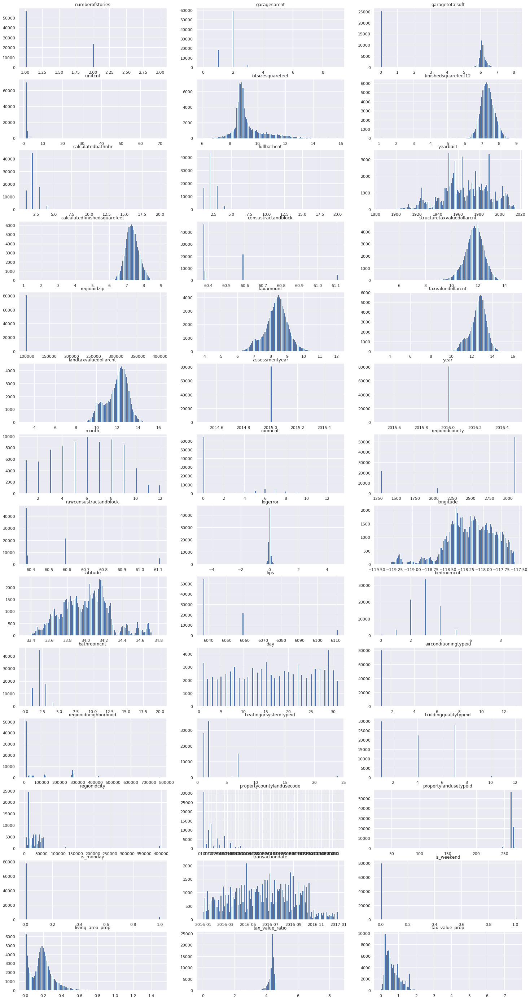

In [ ]:
_, ax = plt.subplots(nrows=14, ncols=3, figsize=(25, 50))

for i, feature_name in enumerate(after_log_transformation.columns):
    ax[i // 3, i % 3].hist(after_log_transformation[feature_name], bins=110)
    ax[i // 3, i % 3].set_title(f'{feature_name}')

Нужные числовые признаки прологарифмированы

# Feature selection

In [ ]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import RFECV

## Зачем отбирать признаки?

1) Понимание того, какие признаки лучше всего объясняют целевую переменную. \
2) Ускорение модели \
3) Решение проблемы мультиколлинеарности (l1, l2 norm) \
4) Снижение шума за счет неинформативных признаков \
5) Повышение точности (коэф. менее смещенные) за счет решения п.3 и п.4


## Different ways of selection

1) Отбирать на основании коэф. корреляции (плохо, ложная корреляция, случайность) \
2) На основании деревьев (`feature importances`) \
3) Понижать размерность, когда все признаки информативные, но их **слишком много** \
4) Полный перебор (по 1, по 2, по 3 и тд). (Лучший метод, если знаем, что информативных признаков немного) \
5) Жадные алгоритмы отбора **ADD-DELL**: строим n моделей на каждый $n_i$ признак (по одному на модель) по нужной метрике, ранжируем и жадно добавляем пока метрика не растет, потом, также жадно удаляем, пока метрика также не растет. (Из минусов то, что пространство перебора маленькое. Может быть такое, что два признака по "важности" находятся рядом а их комбинация дает плохой результат, а может быть такое что один неинформативный дает хороший результат лишь в совокупности с какими-то другими/им неинформативными/ым). Поэтому кстати полный перебор - **лучшее решение**, но долгое. \
6) С помощью регуляризации l1. Зануляет веса у неинформативных признаков. \
7) С помощью статистических тестов и проверок гипотез \
8) Recursive feature elimination

## Clear data

In [ ]:
X = pd.get_dummies(after_log_transformation.drop(['logerror', 'transactiondate'], axis=1))
y = after_log_transformation['logerror']

### l1-norm selection

In [ ]:
def get_coefs_lasso_ridge(alphas, X, y):
    coefs_lasso = np.zeros((alphas.shape[0], X.shape[1]))
    coefs_ridge = np.zeros((alphas.shape[0], X.shape[1]))
    
    for i, alpha in enumerate(alphas):
        lasso_model = Lasso(alpha=alpha, random_state=0)
        lasso_model.fit(X, y)
        coefs_lasso[i, :] = lasso_model.coef_
        
        ridge_model = Ridge(alpha=alpha, random_state=0)
        ridge_model.fit(X, y)
        coefs_ridge[i, :] = ridge_model.coef_
        
    return coefs_lasso, coefs_ridge



alphas = np.arange(1, 70, 5)
coefs_lasso, coefs_ridge = get_coefs_lasso_ridge(alphas, X, y)

In [ ]:
coefs_lasso.shape

(14, 864)

Визуализация динамики весов при увеличении параметра регуляризации $\alpha$

Text(0.5, 1.0, 'Ridge')

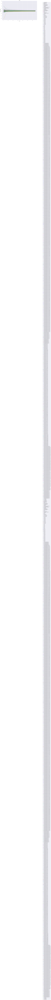

In [ ]:
sns.set(rc={'figure.figsize': (18, 10)})

for coef, feature in zip(coefs_lasso.T, X.columns):
    plt.plot(alphas, coef, label=feature, color=np.random.rand(4))
    
plt.yscale('linear')
plt.legend(loc='upper right', bbox_to_anchor=(1.4, 0.95))
plt.xlabel('alpha')
plt.ylabel('feature weight')
plt.title('Lasso')


sns.set(rc={'figure.figsize': (18, 10)})
for coef, feature in zip(coefs_ridge.T, X.columns):
    plt.plot(alphas, coef, label=feature, color=np.random.rand(4))
plt.legend(loc="upper right", bbox_to_anchor=(1.4, 0.95))
plt.xlabel("alpha")
plt.ylabel("feature weight")
plt.title("Ridge")

Видим, что L2 норма не дает иметь слишком большие веса, тем самым частично устраняет мультиколлинеарность, а L1 норма зануляет коэффициенты при неинформативных признаках.

Для отбора существует хорошая обертка **SelectFromModel** sklearn, ей и воспользуемся.



In [ ]:
lasso_selector = SelectFromModel(Lasso(random_state=0), max_features=85)
lasso_selector.fit(X, y)

SelectFromModel(estimator=Lasso(random_state=0), max_features=85)

In [ ]:
print(X.columns[lasso_selector.get_support()])

Index([], dtype='object')


Как мы уже видели выше, l1 norm вообще зануляет веса всех признаков при устремлении $\alpha$ в бесконечность, и не отбирает ни один из них, даже при пороге в 1e-5

## Embedded methods

In [ ]:
# rf_base = RandomForestRegressor(max_depth=3, oob_score=True, n_jobs=-1, random_state=0)

# rf_base.fit(X, y)

rf_base = RandomForestRegressor(max_depth=2, oob_score=True, n_jobs=-1, random_state=0)

rf_base.fit(X, y)

RandomForestRegressor(max_depth=2, n_jobs=-1, oob_score=True, random_state=0)

In [ ]:
rf_base.oob_score_

0.0006353503548934825

In [ ]:
rf_model = RandomForestRegressor(n_estimators=150, max_depth=3, oob_score=True, n_jobs=-1, random_state=0)

rf_model.fit(X, y)

RandomForestRegressor(max_depth=3, n_estimators=150, n_jobs=-1, oob_score=True,
                      random_state=0)

In [ ]:
rf_model.oob_score_

0.001023816519538534

In [ ]:
ETrees_model = ExtraTreesRegressor(n_estimators=200, max_depth=3, bootstrap=True, oob_score=True, n_jobs=-1, random_state=0, max_samples=0.8)
ETrees_model.fit(X, y)

ExtraTreesRegressor(bootstrap=True, max_depth=3, max_samples=0.8,
                    n_estimators=200, n_jobs=-1, oob_score=True,
                    random_state=0)

In [ ]:
ETrees_model.oob_score_

0.0012753801074539828

Приблизительно 37% данных не попадают в обучающую выборку, **out of bag** `MSE`  - оценка часто бывает слишком оптимистичной, но она черт возьми хороша что у RF, что у ETrees, хочется ей верить.

#### Mean decrease in impurity (RF, ExtraTrees) scores

Оценим значимость признаков с помощью метода **Mean decrease in impurity**, который высчитывает стандартное отклонение важности каждого признака (feature importances in each tree) в лесу

Так как среди признаков в `feature importances` много почти нулевых, визуализируем те, процент которых больше 0.1%

In [ ]:
def mean_decrease_in_impurity(data: pd.DataFrame, rf_model, threshold: float) -> pd.Series:
    
    importances_rf_info = list(sorted(zip(data.columns, rf_model.feature_importances_), key=lambda x: x[1], reverse=True))
    pick = list(filter(lambda x: x[1] > threshold, importances_rf_info))
    names, importances_rf = zip(*pick)

    rf_importances = pd.Series(importances_rf, index=names)
    std_rf = pd.Series(np.std([tree.feature_importances_ for tree in rf_model.estimators_], axis=0), index=data.columns)
    std_rf = std_rf[std_rf.index[std_rf.index.isin(names)]]
    
    return rf_importances, std_rf

def plot_importances(rf_model_name, rf_importances, std_rf):
    fig, ax = plt.subplots()
    rf_importances.plot.bar(yerr=std_rf, ax=ax)
    ax.set_title(f"Feature importances using MDI, {rf_model_name}")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    
    plt.show()

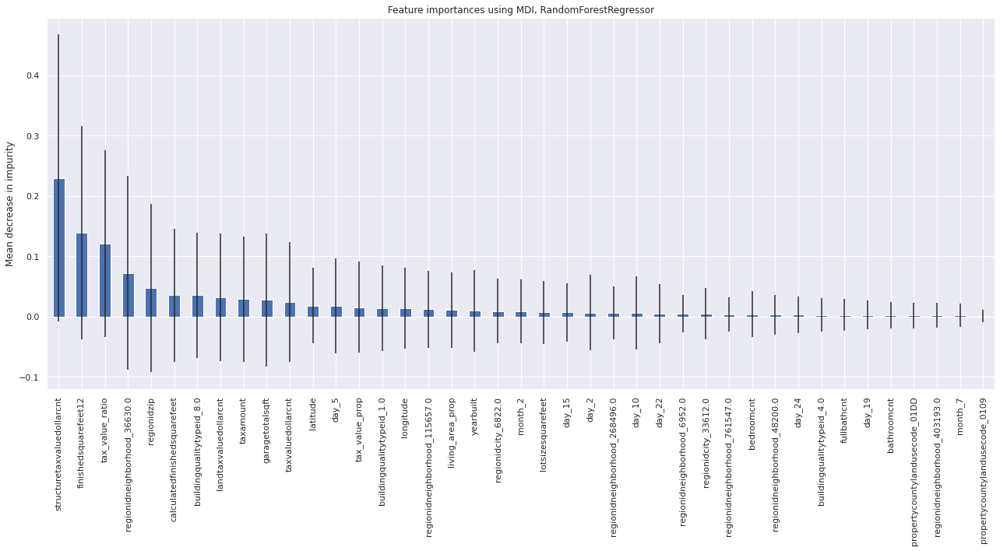

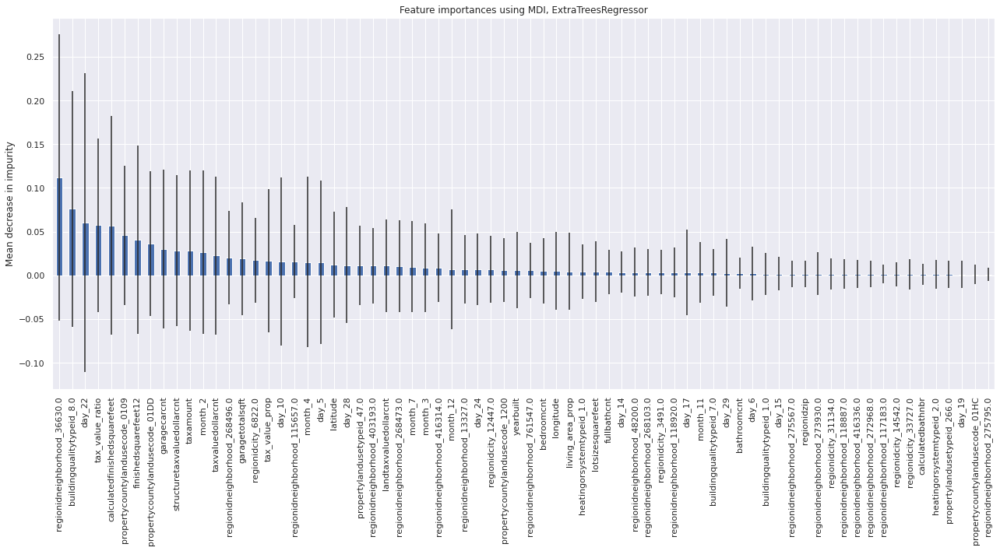

In [ ]:
T = 0.001

rf_base_importances, std_rf_base = mean_decrease_in_impurity(X, rf_base, T)
rf_etrees_importances, std_etrees = mean_decrease_in_impurity(X, ETrees_model, T)

plot_importances(rf_base.__class__.__name__, rf_base_importances, std_rf_base)
plot_importances(ETrees_model.__class__.__name__, rf_etrees_importances, std_etrees)

Видим, что многие признаки по которым больше всего делились деревья пересекаются. Можно сразу отобрать из тех, что > 0.01%, а можно использовать SelectFromModel estimator для отбора сразу по деревьям.



In [ ]:
rf_base_importances[rf_base_importances > T]

structuretaxvaluedollarcnt        0.229323
finishedsquarefeet12              0.138598
tax_value_ratio                   0.120644
regionidneighborhood_36630.0      0.072541
regionidzip                       0.047555
calculatedfinishedsquarefeet      0.035485
buildingqualitytypeid_8.0         0.035442
landtaxvaluedollarcnt             0.031821
taxamount                         0.028815
garagetotalsqft                   0.027541
taxvaluedollarcnt                 0.024133
latitude                          0.018325
day_5                             0.017754
tax_value_prop                    0.015649
buildingqualitytypeid_1.0         0.014161
longitude                         0.013953
regionidneighborhood_115657.0     0.012192
living_area_prop                  0.010666
yearbuilt                         0.009498
regionidcity_6822.0               0.009335
month_2                           0.008911
lotsizesquarefeet                 0.007214
day_15                            0.006840
day_2      

In [ ]:
rf_etrees_importances[rf_etrees_importances > T]

regionidneighborhood_36630.0      0.111534
buildingqualitytypeid_8.0         0.075921
day_22                            0.060322
tax_value_ratio                   0.057236
calculatedfinishedsquarefeet      0.057115
                                    ...   
heatingorsystemtypeid_2.0         0.001174
propertylandusetypeid_266.0       0.001134
day_19                            0.001099
propertycountylandusecode_01HC    0.001088
regionidneighborhood_275795.0     0.001063
Length: 72, dtype: float64

In [ ]:
max_features_to_select = 85

rf_base_select_model = SelectFromModel(rf_base, threshold=T, prefit=True, max_features=max_features_to_select)
rf_select_model = SelectFromModel(rf_model, threshold=T, prefit=True, max_features=max_features_to_select)
etrees_select_model = SelectFromModel(ETrees_model, threshold=T, prefit=True, max_features=max_features_to_select)

In [ ]:
print(X.columns[rf_base_select_model.get_support()])
print(X.columns[rf_select_model.get_support()])
print(X.columns[etrees_select_model.get_support()])

Index(['garagetotalsqft', 'lotsizesquarefeet', 'finishedsquarefeet12',
       'fullbathcnt', 'yearbuilt', 'calculatedfinishedsquarefeet',
       'structuretaxvaluedollarcnt', 'regionidzip', 'taxamount',
       'taxvaluedollarcnt', 'landtaxvaluedollarcnt', 'longitude', 'latitude',
       'bedroomcnt', 'bathroomcnt', 'living_area_prop', 'tax_value_ratio',
       'tax_value_prop', 'month_2', 'month_7', 'day_2', 'day_5', 'day_10',
       'day_15', 'day_19', 'day_22', 'day_24', 'regionidneighborhood_6952.0',
       'regionidneighborhood_36630.0', 'regionidneighborhood_48200.0',
       'regionidneighborhood_115657.0', 'regionidneighborhood_268496.0',
       'regionidneighborhood_403193.0', 'regionidneighborhood_761547.0',
       'buildingqualitytypeid_1.0', 'buildingqualitytypeid_4.0',
       'buildingqualitytypeid_8.0', 'regionidcity_6822.0',
       'regionidcity_33612.0', 'propertycountylandusecode_0109',
       'propertycountylandusecode_01DD'],
      dtype='object')
Index(['garagecarcnt'

## Recursive feature elimination

Суть данного метода в том, чтобы рекурсивно от более большого сета признаков переходить более к маленьким до некоторого наперед заданного порога. \
Метод позволяет избавить от **мультиколлинеарности** если она есть \
Как мы видели, информативных признаков все же немного (около 85), полный перебор будет работать лучше, но все же, посмотрим что отберет данным метод.

Использовать в качестве модели будем те же самые леса, они себя хорошо проявили (**oob оценка впечатлила**). Можно использовать **градиентный бустинг для отбора** в разных методах, но у меня **не хватает вычислительной мощности** (использовался бы он), поэтому данный метод **не рассматривается**

In [ ]:
from sklearn.model_selection import KFold
from yellowbrick.model_selection import RFECV

In [ ]:
rfe_cv_rf_selector = RFECV(rf_base, step=0.3, min_features_to_select=85, cv=6, scoring='neg_mean_absolute_error', verbose=5, n_jobs=-1)

rfe_cv_rf_selector.fit(X, y)

## Selection by all methods

Произведем отбор лучших 85 признаков по мнению всех обученных алгоритмов (на деревьях, l1-norm и recursive feature elimination)

In [ ]:
feature_selection_df = pd.read_csv('/content/drive/MyDrive/Kaggle_competitions/Zillow/feature_selection_df.csv')
# or ..
# feature_selection_df = pd.DataFrame({'Feature': X.columns,
#                                      'Lasso': lasso_selector.get_support(),
#                                      'Random Forest': rf_select_model.get_support(),
#                                      'ExtraTrees': etrees_select_model.get_support(),
#                                      'RFE_CV_on_base_rf': rfe_rf_selector.get_support()})

# feature_selection_df['Total'] = np.sum(feature_selection_df, axis=1)
# feature_selection_df.sort_values(by='Total', ascending=False, inplace=True)

In [ ]:
feature_selection_df.head()

,Feature,Lasso,Random Forest,ExtraTrees,RFE_CV_on_base_rf,Total
0,propertycountylandusecode_01DD,False,True,True,True,3
1,regionidcity_6822.0,False,True,True,True,3
2,bedroomcnt,False,True,True,True,3
3,living_area_prop,False,True,True,True,3
4,tax_value_ratio,False,True,True,True,3


### Best features

In [ ]:
best_features = feature_selection_df.query("Total == 3").Feature

X_best_features = X[best_features]

# Random Forest

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import Pipeline

param_grid = {
    'RandomForestRegressor__n_estimators': [100, 150, 170],
    'RandomForestRegressor__max_depth': [2, 3, 4],
    'RandomForestRegressor__min_samples_split': [3, 5, 6, 7, 8],
    'RandomForestRegressor__max_features': ['auto', 'sqrt'],
}

rf_naive_model = RandomForestRegressor(n_estimators=100, max_depth=4, oob_score=True, n_jobs=-1, random_state=0)
rf_naive_pipeline = Pipeline([
    ('RandomForestRegressor', rf_naive_model),
])

# 6 folds cross validation using K-fold
cv_strategy = 6
search = GridSearchCV(rf_naive_pipeline, param_grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv_strategy, verbose=3)

# split data into train/test (on train cross-validation)
test_frac = 0.3
X_train, X_test, y_train, y_test = train_test_split(X_best_features, y, test_size=test_frac, random_state=0, shuffle=True)

# tuning params on train set
search.fit(X_train, y_train)

Так как тестовой выборки у нас нет, используем всю выборку для обучения и,одновременно, валидации (подбор гиперпараметров на кросс-валидации).

Можно конечно выделить что-то на тест, тогда train/val будет иметь меньше семплов

In [ ]:
# X_train, y_train = X_best_features.copy(), y.copy()

# test_frac = 0.3
# X_train, X_test, y_train, y_test = train_test_split(X_best_features, y, test_size=test_frac, random_state=0, shuffle=True)

Best rf params from grid search higher

{'RandomForestRegressor__max_depth': 4,
 'RandomForestRegressor__max_features': 'sqrt',
 'RandomForestRegressor__min_samples_split': 8,
 'RandomForestRegressor__n_estimators': 150}

In [ ]:
# best_rf = search.best_estimator_
best_rf = make_pipeline(RandomForestRegressor(max_depth=4, max_features='sqrt',
                                              min_samples_split=8, n_estimators=150,
                                              n_jobs=-1, random_state=0))

best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)

mean_absolute_error(y_test, y_pred)

0.06514949362485593

Теперь проанализируем остатки, их распределение должно быть нормальным, в идеале, так, будет выполняться свойство **гомоскедантичности**

Text(0, 0.5, 'residuals')

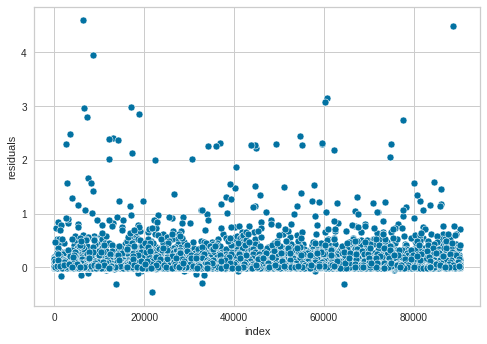

In [ ]:
residuals = (np.abs(y_test) - np.abs(y_pred)).reset_index()
sns.scatterplot(data=residuals, x='index', y='logerror')
plt.ylabel('residuals')

Здесь уже даже видно (не смысла строить qq-plot), гомоскедантичности не наблюдается. Видим, что в прогнозах присутствуют выбросы, что может свидетельствовать о том, что модель страдает от (high bias)

Чтобы это показать, можно построить `learning curves` (кривые обучения)

# Learning curves

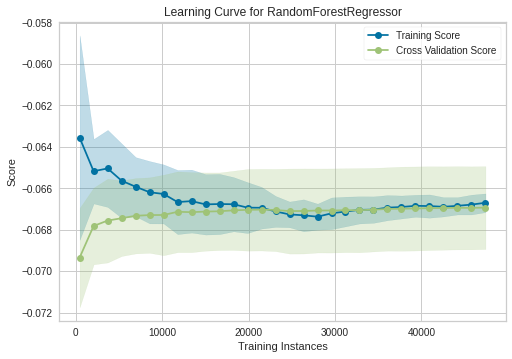

In [ ]:
from yellowbrick.model_selection import LearningCurve

visualizer = LearningCurve(
    best_rf, cv=cv_strategy, scoring='neg_mean_absolute_error', train_sizes=np.linspace(0.01, 1, 30), n_jobs=-1, shuffle=True,
)

visualizer.fit(X_train, y_train)
visualizer.show()

Здесь все стало понятно, что модель имеет небольшое смещение относительно истинного характера взаимосвязи.

Увеличение количества данных не поможет. Кажется, что Random Forest достиг своего максимума в производительности (за исключением большего пространства для подбора гиперпараметров которое я не рассматриваю из-за отсутствия серьезной вычислительной мощности).

Ниже рассмотрим иной способ формирования ансамбля -- **Boosting**: **Gradient Boosting**

### Random forest on all data

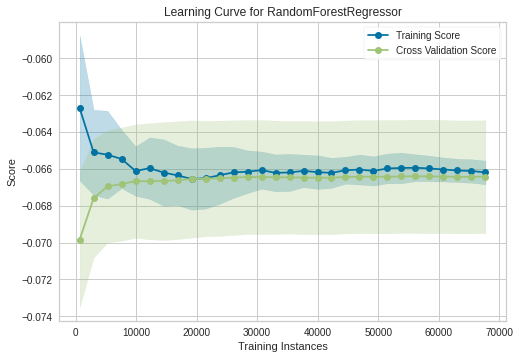

In [ ]:
best_rf = RandomForestRegressor(max_depth=4, max_features='sqrt',
                                              min_samples_split=8, n_estimators=150,
                                              n_jobs=-1, random_state=0)

X_all, y_all = X_best_features.copy(), y.copy()

visualizer = LearningCurve(
    best_rf, cv=cv_strategy, scoring='neg_mean_absolute_error', train_sizes=np.linspace(0.01, 1, 30), n_jobs=-1, shuffle=True,
)

visualizer.fit(X_all, y_all)
visualizer.show()

Видим, что смещение имеется более значительное чем с выборкой в 70% от исходной. Либо увеличивать пространство подбора гиперпараметров дабы усложнить ее, либо брать другую модель.

## Regression models

70% subsample

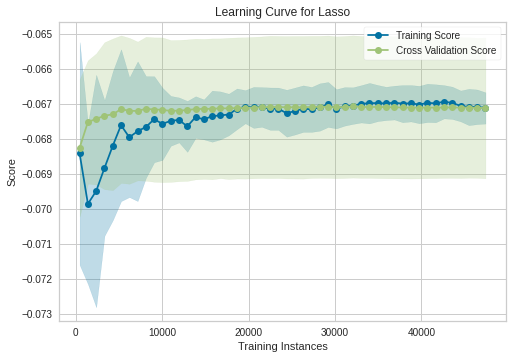

In [ ]:
lasso_model = make_pipeline(StandardScaler(), Lasso(alpha=0.01))
lasso_model.fit(X_train, y_train)

visualizer = LearningCurve(
    lasso_model, cv=cv_strategy, scoring='neg_mean_absolute_error', train_sizes=np.linspace(0.01, 1, 50), n_jobs=-1, shuffle=True,
)

visualizer.fit(X_train, y_train)
visualizer.show()

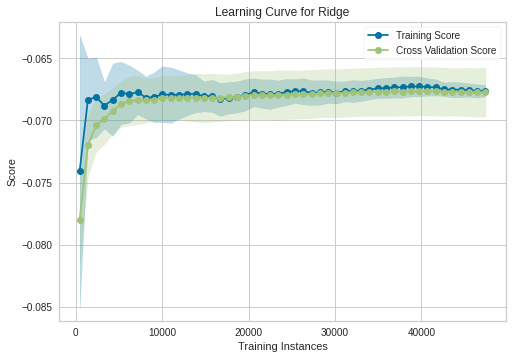

In [ ]:
ridge_model = make_pipeline(StandardScaler(), Ridge(alpha=5))
ridge_model.fit(X_train, y_train)

visualizer = LearningCurve(
    ridge_model, cv=cv_strategy, scoring='neg_mean_absolute_error', train_sizes=np.linspace(0.01, 1, 50), n_jobs=-1, shuffle=True,
)

visualizer.fit(X_train, y_train)
visualizer.show()

Lasso и Ridge также страдают от небольшого смещения.


Для вышеуказанных моделей можно увеличить пространство подбора гиперпараметров (в сторону усложнения модели), построить кривые валидации, что может помочь в уменьшения смещения.

Делать я этого конечно же не буду для линейных моделей

## XGBoost

In [ ]:
import joblib
import xgboost as xgb

from sklearn.model_selection import KFold

xgb_grid = {
    'xgb_model__n_estimators': [200, 250, 300, 500],
    'xgb_model__eta': [0.1, 0.2, 0.3],
    'xgb_model__max_depth': [4, 5, 6, 7],
    'xgb_model__subsample': [0.7, 0.8],
}

xgb_model = xgb.XGBRegressor()

xgb_pipeline = Pipeline([
    ('st_scaler', StandardScaler()),
    ('xgb_model', xgb_model),
])

# 6 folds cross validation using K-fold
cv_strategy = 6
search = GridSearchCV(xgb_pipeline,
                      xgb_grid,
                      scoring='neg_mean_absolute_error',
                      refit=True,
                      n_jobs=-1,
                      cv=KFold(n_splits=cv_strategy,
                               shuffle=True,
                               random_state=0),
                      verbose=3)

# split data into train/test (on train cross-validation)
X_all, y_all = X_best_features.copy(), y.copy()

# tuning params on train set (with cross-validation)
search.fit(X_all, y_all)

joblib.dump(search, f'{DATA_PATH}/gr_search_obj.pkl')
joblib.dump(search.best_estimator_, f'{DATA_PATH}/xgboost_model.pkl')

Fitting 6 folds for each of 96 candidates, totalling 576 fits


## Learning curves for XGBoost

In [ ]:
visualizer = LearningCurve(
    search.best_estimator_, cv=cv_strategy, scoring='neg_mean_absolute_error', train_sizes=np.linspace(0.01, 1, 50), n_jobs=-1, shuffle=True,
)

visualizer.fit(X_all, y_all)
visualizer.show()

## MAE on cross-validation, XGBoost

In [ ]:
from sklearn.model_selection import cross_val_score

cv_strategy = 6

cross_val_score(search.best_estimator_,
                X_all, y=y_all,
                scoring='neg_mean_absolute_error',
                cv=KFold(cv_strategy),
                n_jobs=-1)

# XGBoost predictions

In [ ]:
best_features = feature_selection_df.query('Total == 3').Feature
X_test = df_test[best_features]

xgb_predictions = search.best_estimator_.predict(X_test)

# write predictions for 3 months
months = ['201610', '201611', '201612']

xgb_pred_df = df_test[['parcelid', *months]]
for i, xgb_prediction in enumerate(xgb_predictions):
    xgb_pred_df[i, months] = xgb_prediction


xgb_pred_df.to_csv(f'{DATA_PATH}/xgb_predictions.csv', index=False)